# Evaluate mock community classification accuracy
The purpose of this notebook is to evaluate taxonomic classification accuracy of mock communities using different classification methods.

Prepare the environment
-----------------------

First we'll import various functions that we'll need for generating the report. 

In [1]:
%matplotlib inline
from os.path import join, exists, expandvars
import pandas as pd
from IPython.display import display, Markdown
import seaborn.xkcd_rgb as colors
from tax_credit.plotting_functions import (pointplot_from_data_frame,
                                           boxplot_from_data_frame,
                                           heatmap_from_data_frame,
                                           per_level_kruskal_wallis,
                                           beta_diversity_pcoa,
                                           average_distance_boxplots,
                                           rank_optimized_method_performance_by_dataset)
from tax_credit.mock_evaluation import evaluate_results
from tax_credit.eval_framework import (method_by_dataset_a1,
                                       parameter_comparisons,
                                       merge_expected_and_observed_tables,
                                       filter_df)


Configure local environment-specific values
-------------------------------------------

**This is the only cell that you will need to edit to generate basic reports locally.** After editing this cell, you can run all cells in this notebook to generate your analysis report. This will take a few minutes to run, as results are computed at multiple taxonomic levels.

Values in this cell will not need to be changed, with the exception of ``project_dir``, to generate the default results contained within tax-credit. To analyze results separately from the tax-credit precomputed results, other variables in this cell will need to be set.

In [2]:
## project_dir should be the directory where you've downloaded (or cloned) the 
## tax-credit repository. 
project_dir = expandvars("../../")

## expected_results_dir contains expected composition data in the structure
## expected_results_dir/<dataset name>/<reference name>/expected/
expected_results_dir = join(project_dir, "data/precomputed-results/", "mock-community")

## mock_results_fp designates the files to which summary results are written.
## If this file exists, it can be read in to generate results plots, instead
## of computing new scores.
mock_results_fp = join(expected_results_dir, 'mock_results.tsv')

## results_dirs should contain the directory or directories where
## results can be found. By default, this is the same location as expected 
## results included with the project. If other results should be included, 
## absolute paths to those directories should be added to this list.
results_dirs = [expected_results_dir]

## directory containing mock community data, e.g., feature table without taxonomy
mock_dir = join(project_dir, "data", "mock-community")

## Minimum number of times an OTU must be observed for it to be included in analyses. Edit this
## to analyze the effect of the minimum count on taxonomic results.
min_count = 1

## Define the range of taxonomic levels over which to compute accuracy scores.
## The default given below will compute order (level 2) through species (level 6)
taxonomy_level_range = range(2,7)


# we can save plots in this directory
outdir = join(expandvars("../../../"), 'plots')

In [3]:
dataset_ids = ['mock-1', 'mock-2', 'mock-3', 'mock-4', 'mock-5', 'mock-7', 'mock-8', 'mock-9',
               'mock-10', 'mock-12', 'mock-16', 'mock-18', 'mock-19', 'mock-20', 'mock-21', 
               'mock-22', 'mock-23', 'mock-24', 'mock-26-ITS1', 'mock-26-ITS9']
method_ids = ['rdp', 'sortmerna', 'uclust', 'blast', 'blast+', 'naive-bayes', 'naive-bayes-bespoke', 'vsearch']
ref_ids = ['gg_13_8_otus', 'unite_20.11.2016_clean_fullITS']

Find mock community pre-computed tables, expected tables, and "query" tables
----------------------------------------------------------------------------

Next we'll use the paths defined above to find all of the tables that will be compared. These include the *pre-computed result* tables (i.e., the ones that the new methods will be compared to), the *expected result* tables (i.e., the tables containing the known composition of the mock microbial communities), and the *query result* tables (i.e., the tables generated with the new method(s) that we want to compare to the *pre-computed result* tables).

**Note**: if you have added additional methods to add, set `append=True`. If you are attempting to recompute pre-computed results, set `force=True`.

This cell will take a few minutes to run if new results are being added, so hold onto your hat. If you are attempting to re-compute everything, it may take an hour or so, so go take a nap.

In [4]:
mock_results = evaluate_results(results_dirs, 
                                expected_results_dir, 
                                mock_results_fp, 
                                mock_dir,
                                taxonomy_level_range=range(2,7), 
                                min_count=min_count,
                                taxa_to_keep=None, 
                                md_key='taxonomy', 
                                subsample=False,
                                per_seq_precision=True,
                                exclude=['other'],
                                dataset_ids=dataset_ids,
                                reference_ids=ref_ids,
                                method_ids=method_ids,
                                append=False,
                                force=False,
                                backup=False)

../../data/precomputed-results/mock-community/mock_results.tsv already exists.
Reading in pre-computed evaluation results.
To overwrite, set force=True
Results have been filtered to only include datasets or reference databases or methods or parameters that are explicitly set by results params. To disable this function and load all results, set dataset_ids and reference_ids and method_ids and parameter_ids to None.


Restrict analyses to a set of datasets or references: e.g., exclude taxonomy assignments made for purpose of reference database comparisons. This can be performed as shown below — alternatively, specific reference databases, datasets, methods, or parameters can be chosen by setting dataset_ids, reference_ids, method_ids, and parameter_ids in the evaluate_results command above.

In [5]:
# mock_results = filter_df(mock_results, column_name='Method', values=['naive-bayes'], exclude=False)
mock_results = mock_results.reset_index(drop=True)

Compute and summarize precision, recall, and F-measure for mock communities
----------------------------------------------------------------------------------------

In this evaluation, we compute and summarize precision, recall, and F-measure of each result (pre-computed and query) based on the known composition of the mock communities. We then summarize the results in two ways: first with boxplots, and second with a table of the top methods based on their F-measures. **Higher scores = better accuracy**

As a first step, we will evaluate **average** method performance at each taxonomic level for each method within each reference dataset type.

**Note that, as parameter configurations can cause results to vary widely, average results are not a good representation of the "best" results. See [here](#Optimized-method-performance) for results using optimized parameters for each method.**

First we will define our [color palette](http://matplotlib.org/examples/color/named_colors.html) and the variables we want to plot. Via seaborn, we can apply the [xkcd crowdsourced color names](https://xkcd.com/color/rgb.txt). If that still doesn't match your hue, use hex codes.

In [6]:
color_palette={
    'expected': 'black', 'rdp': colors['baby shit green'], 'sortmerna': colors['macaroni and cheese'],
    'uclust': 'coral', 'blast': 'indigo', 'blast+': colors['electric purple'], 'naive-bayes': 'dodgerblue',
    'naive-bayes-bespoke': 'blue', 'vsearch': 'firebrick'
}

y_vars = ["Precision", "Recall", "F-measure", "Taxon Accuracy Rate", "Taxon Detection Rate"]

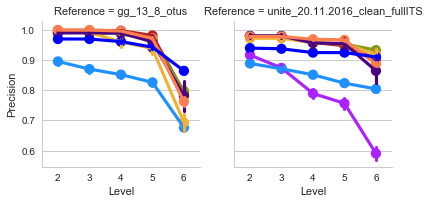

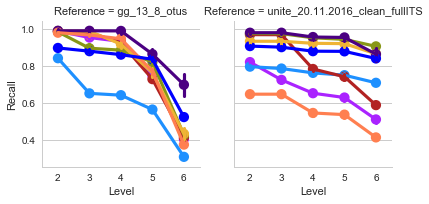

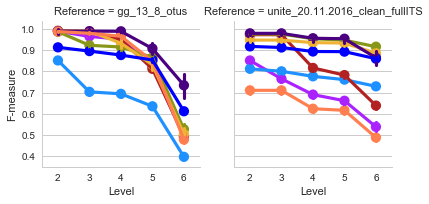

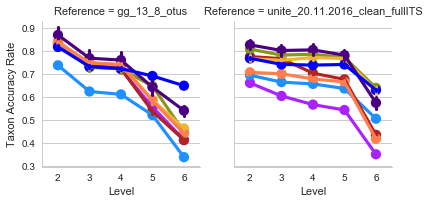

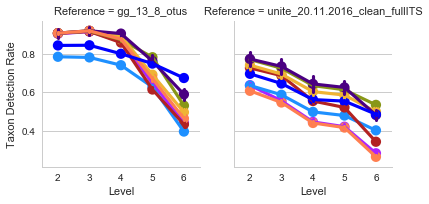

In [8]:
point = pointplot_from_data_frame(mock_results, "Level", y_vars, 
                                  group_by="Reference", color_by="Method",
                                  color_palette=color_palette)

In [10]:
for k, v in point.items():
    v.savefig(join(outdir, 'mock-{0}-lineplots.pdf'.format(k)))

### Kruskal-Wallis between-method accuracy comparisons
Kruskal-Wallis FDR-corrected p-values comparing classification methods at each level of taxonomic assignment

In [11]:
result = per_level_kruskal_wallis(mock_results, y_vars, group_by='Method', 
                                  dataset_col='Reference', level_name='Level',
                                  levelrange=range(2,7), alpha=0.05, 
                                  pval_correction='fdr_bh')
result

,Reference,Variable,2,3,4,5,6
0,gg_13_8_otus,Precision,1.507747e-47,1.854806e-77,9.910988e-51,3.609426e-65,2.406841e-310
1,gg_13_8_otus,Recall,3.113942e-51,6.712403e-242,1.789303e-273,0.000000e+00,4.778745e-205
2,gg_13_8_otus,F-measure,2.755966e-50,1.397661e-242,3.850779e-272,0.000000e+00,5.978456e-211
3,gg_13_8_otus,Taxon Accuracy Rate,5.037725e-12,4.870274e-76,8.147172e-60,2.475215e-302,0.000000e+00
4,gg_13_8_otus,Taxon Detection Rate,1.326490e-30,4.209898e-31,3.360070e-19,3.921844e-241,0.000000e+00
5,unite_20.11.2016_clean_fullITS,Precision,3.547503e-36,2.160250e-58,2.998770e-96,3.664661e-100,2.377685e-268
6,unite_20.11.2016_clean_fullITS,Recall,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
7,unite_20.11.2016_clean_fullITS,F-measure,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
8,unite_20.11.2016_clean_fullITS,Taxon Accuracy Rate,1.173900e-161,8.258546e-169,1.677852e-191,1.505928e-226,0.000000e+00
9,unite_20.11.2016_clean_fullITS,Taxon Detection Rate,1.489817e-91,3.993707e-132,2.571375e-147,8.253999e-176,0.000000e+00


### Heatmaps of per-level accuracy
Heatmaps show the performance of individual method/parameter combinations at each taxonomic level, in each reference database (i.e., for bacterial and fungal mock communities individually).

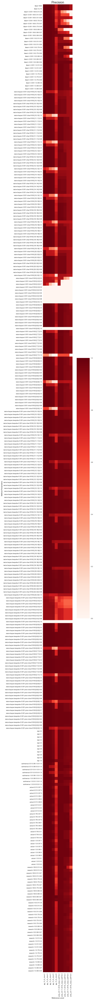

In [12]:
heatmap_from_data_frame(mock_results, metric="Precision", rows=["Method", "Parameters"], cols=["Reference", "Level"])

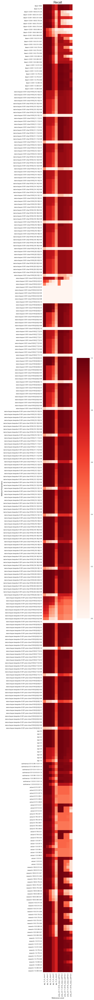

In [13]:
heatmap_from_data_frame(mock_results, metric="Recall", rows=["Method", "Parameters"], cols=["Reference", "Level"])

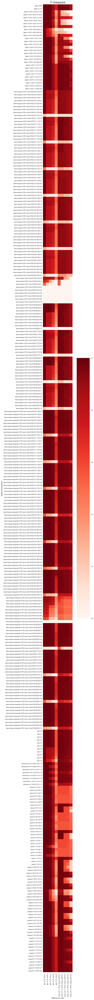

In [14]:
heatmap_from_data_frame(mock_results, metric="F-measure", rows=["Method", "Parameters"], cols=["Reference", "Level"])

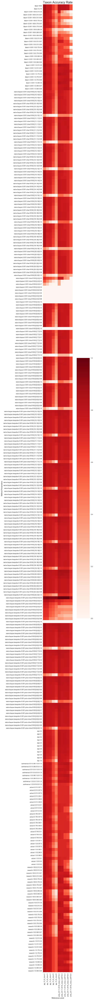

In [15]:
heatmap_from_data_frame(mock_results, metric="Taxon Accuracy Rate", rows=["Method", "Parameters"], cols=["Reference", "Level"])

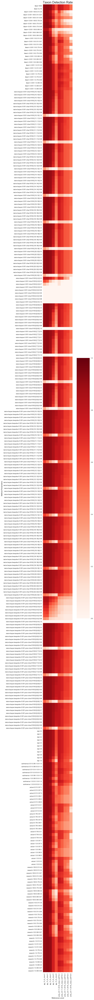

In [16]:
heatmap_from_data_frame(mock_results, metric="Taxon Detection Rate", rows=["Method", "Parameters"], cols=["Reference", "Level"])

Now we will focus on results at species level (for genus level, change to level 5)

In [7]:
mock_results_6 = mock_results[mock_results['Level'] == 6]

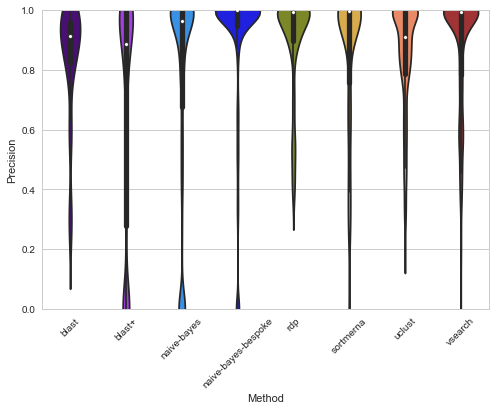

In [8]:
boxplot_from_data_frame(mock_results_6, group_by="Method", metric="Precision", color_palette=color_palette)

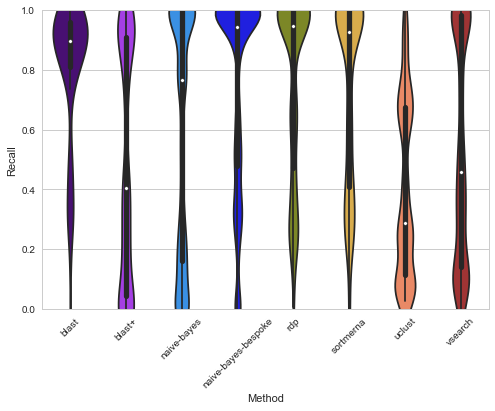

In [9]:
boxplot_from_data_frame(mock_results_6, group_by="Method", metric="Recall", color_palette=color_palette)

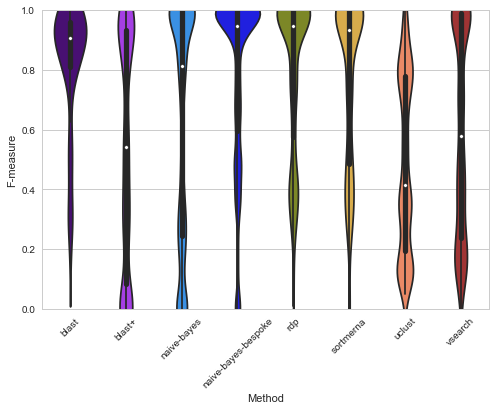

In [10]:
boxplot_from_data_frame(mock_results_6, group_by="Method", metric="F-measure", color_palette=color_palette)

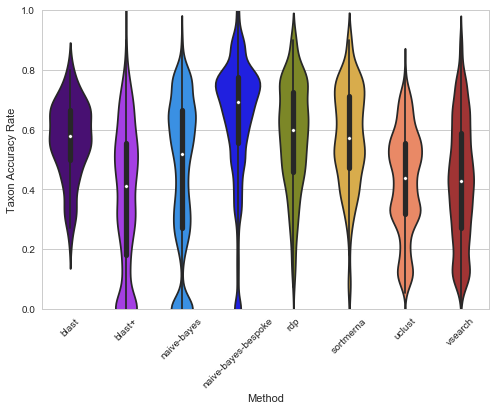

In [11]:
boxplot_from_data_frame(mock_results_6, group_by="Method", metric="Taxon Accuracy Rate", color_palette=color_palette)

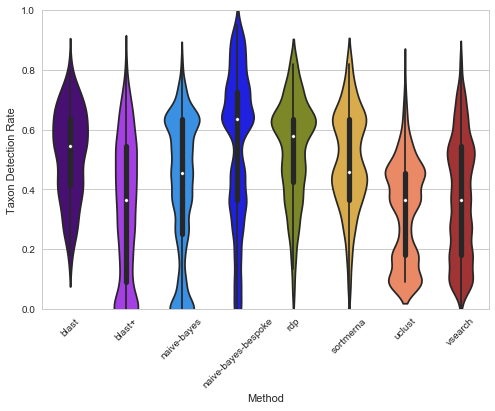

In [12]:
boxplot_from_data_frame(mock_results_6, group_by="Method", metric="Taxon Detection Rate", color_palette=color_palette)

Look at F-measure at genus level

In [13]:
mock_results_5 = mock_results[mock_results['Level'] == 5]

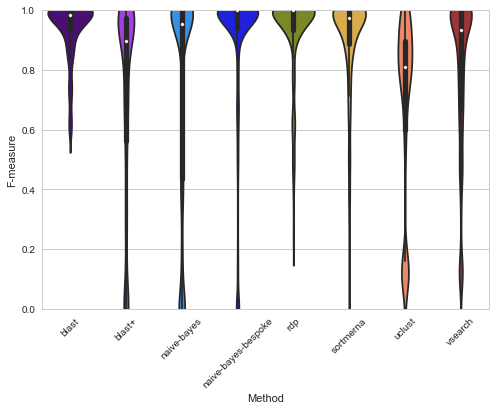

In [14]:
boxplot_from_data_frame(mock_results_5, group_by="Method", metric="F-measure", color_palette=color_palette)

In [20]:
mock_results_5.groupby("Method").median()


,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,5,1.0,0.968912,0.984211,0.750000,0.727273
blast+,5,1.0,0.849341,0.897696,0.583333,0.538462
naive-bayes,5,1.0,0.947026,0.951923,0.666667,0.636364
naive-bayes-bespoke,5,1.0,1.000000,1.000000,0.771429,0.636364
rdp,5,1.0,0.999990,0.999990,0.750000,0.727273
sortmerna,5,1.0,0.956708,0.972085,0.714286,0.636364
uclust,5,1.0,0.713621,0.810810,0.636364,0.542857
vsearch,5,1.0,0.894203,0.932479,0.628571,0.545455


In [23]:
mock_results_5.groupby("Method").std()

,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,0.0,0.091380,0.113460,0.099558,0.144590,0.189215
blast+,0.0,0.321829,0.357214,0.349524,0.250316,0.263426
naive-bayes,0.0,0.350885,0.394216,0.378837,0.294774,0.299700
naive-bayes-bespoke,0.0,0.209343,0.274806,0.258039,0.213479,0.272208
rdp,0.0,0.097528,0.186111,0.152516,0.166270,0.207367
sortmerna,0.0,0.124508,0.195748,0.164674,0.169572,0.187481
uclust,0.0,0.068539,0.313915,0.309204,0.174172,0.212127
vsearch,0.0,0.095198,0.301211,0.266225,0.181140,0.215745


In [21]:
mock_results_6.groupby("Method").median()

,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,6,0.911808,0.898308,0.905669,0.578947,0.545455
blast+,6,0.885315,0.406352,0.542705,0.410256,0.363636
naive-bayes,6,0.963514,0.766478,0.811590,0.520000,0.454545
naive-bayes-bespoke,6,1.000000,0.942217,0.948357,0.692308,0.636364
rdp,6,0.992066,0.947026,0.948357,0.600000,0.578947
sortmerna,6,0.995403,0.927770,0.932479,0.571429,0.460000
uclust,6,0.910492,0.289107,0.415764,0.440000,0.363636
vsearch,6,0.992308,0.458496,0.580192,0.428571,0.363636


In [22]:
mock_results_6.groupby("Method").std()

,Level,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
Method,,,,,,
blast,0.0,0.203380,0.226256,0.215324,0.127848,0.148844
blast+,0.0,0.405526,0.391825,0.388711,0.241750,0.230588
naive-bayes,0.0,0.361718,0.404387,0.390941,0.255675,0.236117
naive-bayes-bespoke,0.0,0.247967,0.330187,0.299690,0.207314,0.251360
rdp,0.0,0.177257,0.305923,0.267272,0.178491,0.168614
sortmerna,0.0,0.249246,0.313537,0.284816,0.168591,0.164231
uclust,0.0,0.185041,0.293794,0.291339,0.170592,0.168700
vsearch,0.0,0.202364,0.369768,0.341499,0.202229,0.197371


In the following heatmaps, we assess accuracy rates in each dataset X method configuration combination. This allows us to assess how evenly configurations affect performance, whether specific mock communities outperform of underperform relative to others, and generally assess how increasing/decreasing specific parameters affects accuracy.

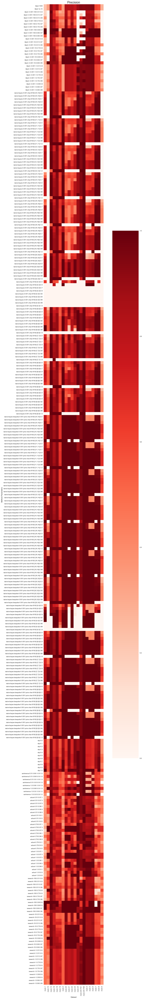

In [25]:
heatmap_from_data_frame(mock_results_6, "Precision")

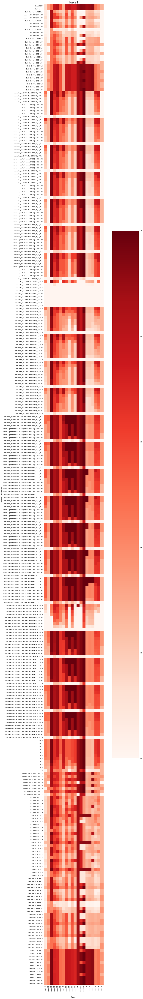

In [26]:
heatmap_from_data_frame(mock_results_6, "Recall")

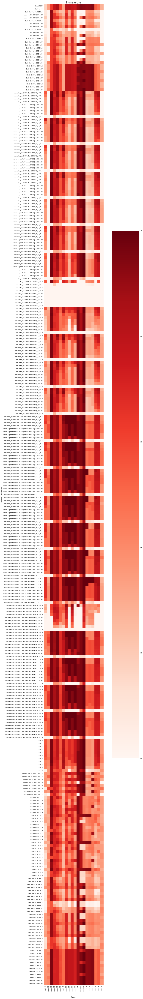

In [27]:
heatmap_from_data_frame(mock_results_6, "F-measure")

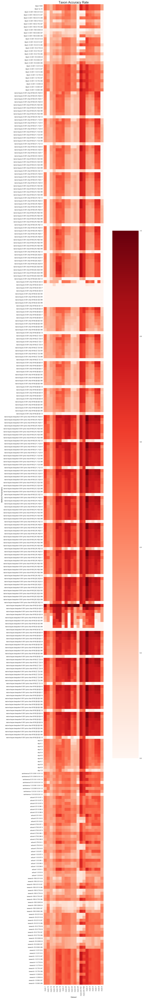

In [28]:
heatmap_from_data_frame(mock_results_6, "Taxon Accuracy Rate")

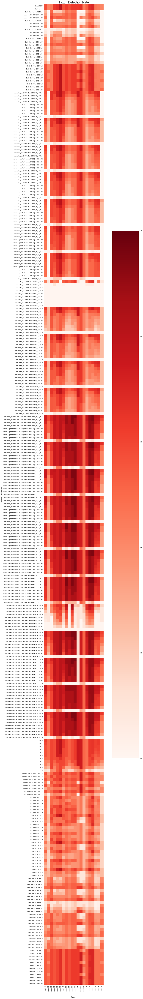

In [29]:
heatmap_from_data_frame(mock_results_6, "Taxon Detection Rate")

### Method Optimization
Which method/parameter configuration performed "best" for a given score? We can rank the top-performing configuration by dataset, method, and taxonomic level.

First, the top-performing method/configuration combination by dataset.

In [30]:
for dataset in mock_results_6['Dataset'].unique():
    display(Markdown('## {0}'.format(dataset)))
    best = method_by_dataset_a1(mock_results_6, dataset)
    display(best)

## mock-8

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
4422,naive-bayes-bespoke,"0.001:prior:char:8192:[16,16]:0.5",0.985273,0.817671,0.893681,0.860000,0.796296
1662,naive-bayes,"0.001:char:8192:[18,18]:0.5",0.978409,0.800016,0.880266,0.679245,0.666667
2654,rdp,0.4,0.937163,0.705506,0.805000,0.603774,0.592593
3284,uclust,0.51:0.97:3,0.662203,0.509471,0.575883,0.551020,0.500000
2054,vsearch,1:0.99:0.99,0.669105,0.494585,0.568759,0.565217,0.481481
2789,sortmerna,0.51:0.99:1:0.9:1.0,0.659963,0.413790,0.508657,0.511111,0.425926
299,blast+,0.001:1:0.51:0.8,0.624731,0.422299,0.503946,0.510638,0.444444
2879,blast,1e-10,0.624731,0.422299,0.503946,0.510638,0.444444


## mock-26-ITS1

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
18993,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",1.000000,1.000000,1.000000,0.777778,0.636364
13233,vsearch,1:0.75:0.97,1.000000,1.000000,1.000000,0.777778,0.636364
6033,blast+,0.001:1:0.99:0.99,1.000000,1.000000,1.000000,0.777778,0.636364
11313,naive-bayes,"0.001:char:8192:[14,14]:0.0",1.000000,1.000000,1.000000,0.777778,0.636364
16173,sortmerna,0.51:0.99:5:0.9:1.0,1.000000,1.000000,1.000000,0.777778,0.636364
15753,rdp,0.2,1.000000,1.000000,1.000000,0.777778,0.636364
16413,blast,1e-10,0.984163,0.984163,0.984163,0.666667,0.545455
17973,uclust,0.76:0.9:1,0.984163,0.984163,0.984163,0.666667,0.545455


## mock-7

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
28647,naive-bayes-bespoke,"0.001:prior:char:8192:[16,16]:0.0",0.979330,0.823178,0.894490,0.840000,0.777778
26187,naive-bayes,"0.001:char:8192:[18,18]:0.5",0.936550,0.756941,0.837221,0.705882,0.666667
27194,rdp,0.3,0.862963,0.668879,0.753626,0.627451,0.592593
27779,uclust,0.51:0.9:3,0.752492,0.466084,0.575630,0.571429,0.444444
27359,sortmerna,0.51:0.9:1:0.9:1.0,0.670887,0.496033,0.570360,0.545455,0.444444
24554,blast+,0.001:1:0.51:0.97,0.640563,0.500886,0.562179,0.543478,0.462963
27404,blast,1e-10,0.640563,0.500886,0.562179,0.543478,0.462963
26684,vsearch,1:0.99:0.8,0.625602,0.456603,0.527907,0.577778,0.481481


## mock-2

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
30704,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.0",1.000000,0.905037,0.950152,0.725000,0.783784
29774,naive-bayes,"0.001:char:8192:[9,9]:0.5",1.000000,0.862307,0.926063,0.555556,0.675676
30304,rdp,0.7,1.000000,0.779486,0.876080,0.511628,0.594595
30129,vsearch,10:0.51:0.99,0.549971,0.476456,0.510581,0.487805,0.540541
30459,uclust,1.0:0.9:1,0.523875,0.431704,0.473344,0.525000,0.567568
30344,sortmerna,1.0:0.9:1:0.9:1.0,0.494340,0.391467,0.436930,0.485714,0.459459
29504,blast+,0.001:100:0.51:0.99,0.508952,0.273960,0.356189,0.463415,0.513514
30384,blast,1000,0.350540,0.288866,0.316729,0.488372,0.567568


## mock-3

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
36102,naive-bayes-bespoke,"0.001:prior:char:8192:[12,12]:0.5",1.000000,1.000000,1.000000,0.950000,0.95
35244,uclust,0.51:0.9:1,0.988422,0.953779,0.970792,0.769231,0.50
31564,blast+,0.001:1:0.75:0.97,0.945743,0.912596,0.928874,0.692308,0.45
34884,blast,1000,0.945743,0.912596,0.928874,0.692308,0.45
34001,vsearch,1:0.51:0.9,0.949057,0.896317,0.921933,0.705882,0.60
34821,sortmerna,0.51:0.99:5:0.9:1.0,0.914761,0.328205,0.483085,0.555556,0.50
34663,rdp,0.8,0.915142,0.304494,0.456948,0.538462,0.35
32683,naive-bayes,"0.001:char:8192:[8,8]:0.0",0.907022,0.304494,0.455929,0.538462,0.35


## mock-10

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
41518,naive-bayes-bespoke,"0.001:prior:char:8192:[7,7]:0.94",0.997564,0.522668,0.685941,0.461538,0.500000
40378,sortmerna,1.0:0.99:5:0.9:1.0,1.000000,0.435936,0.607180,0.416667,0.416667
40003,vsearch,100:0.75:0.97,0.642512,0.435936,0.519439,0.428571,0.500000
40198,rdp,0.6,0.576611,0.441873,0.500330,0.352941,0.500000
37678,blast+,0.001:1:0.51:0.99,0.476931,0.435936,0.455513,0.428571,0.500000
40543,uclust,0.76:0.97:3,1.000000,0.289107,0.448539,0.333333,0.166667
38653,naive-bayes,"0.001:char:8192:[11,11]:0.96",0.574485,0.289107,0.384644,0.250000,0.250000
40483,blast,1e-10,0.346096,0.346096,0.346096,0.333333,0.416667


## mock-23

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
43644,naive-bayes-bespoke,"0.001:prior:char:8192:[11,11]:0.92",0.999958,0.999906,0.999932,0.629630,0.894737
43469,blast,1e-10,0.777240,0.736385,0.756261,0.444444,0.631579
42544,blast+,0.001:1:0.99:0.97,0.777240,0.736385,0.756261,0.444444,0.631579
42764,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.945478,0.628949,0.755396,0.288889,0.684211
43374,rdp,0.6,0.945470,0.626301,0.753480,0.315789,0.631579
43239,vsearch,1:0.75:0.8,0.745446,0.706217,0.725301,0.480000,0.631579
43549,uclust,0.51:0.99:3,0.744739,0.703471,0.723517,0.458333,0.578947
43424,sortmerna,1.0:0.9:1:0.9:1.0,0.742659,0.703551,0.722577,0.392857,0.578947


## mock-18

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
45609,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.5",1.000000,0.942504,0.970401,0.800000,0.800000
44589,naive-bayes,"0.001:char:8192:[12,12]:0.5",0.942771,0.888565,0.914866,0.578947,0.733333
44174,blast+,0.001:1:0.99:0.8,0.866472,0.816653,0.840825,0.500000,0.666667
45099,blast,1000,0.866472,0.816653,0.840825,0.526316,0.666667
45049,rdp,0.2,0.820735,0.773546,0.796442,0.523810,0.733333
45234,uclust,0.76:0.9:1,0.819872,0.772732,0.795605,0.647059,0.733333
44989,vsearch,1:0.51:0.99,0.743117,0.700391,0.721122,0.600000,0.600000
45059,sortmerna,1.0:0.9:1:0.9:1.0,0.743117,0.700391,0.721122,0.450000,0.600000


## mock-4

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
50417,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.5",0.999752,0.999752,0.999752,0.863636,0.95
49898,uclust,1.0:0.9:1,0.987503,0.955909,0.971449,0.538462,0.70
46178,blast+,0.001:1:0.51:0.8,0.946067,0.918123,0.931886,0.560000,0.70
49618,blast,1e-10,0.946067,0.918123,0.931886,0.538462,0.70
49036,vsearch,1:0.51:0.97,0.955963,0.906693,0.930676,0.619048,0.65
49516,sortmerna,0.51:0.9:5:0.9:1.0,0.937503,0.406352,0.566960,0.521739,0.60
47596,naive-bayes,"0.001:char:8192:[32,32]:0.98",0.895793,0.378540,0.532190,0.434783,0.50
49299,rdp,0.5,0.908339,0.285428,0.434365,0.464286,0.65


## mock-24

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
53139,vsearch,100:0.51:0.9,1.000000,0.889646,0.941601,0.095238,0.250
52329,blast+,0.001:1:0.51:0.97,1.000000,0.889646,0.941601,0.210526,0.500
53184,rdp,0.6,1.000000,0.889646,0.941601,0.285714,0.750
53239,sortmerna,1.0:0.99:1:0.9:1.0,1.000000,0.889646,0.941601,0.400000,0.500
53284,uclust,0.76:0.99:1,1.000000,0.889646,0.941601,0.333333,0.375
52814,naive-bayes,"0.001:char:8192:[8,8]:0.96",1.000000,0.889646,0.941601,0.227273,0.625
53644,naive-bayes-bespoke,"0.001:prior:char:8192:[11,11]:0.96",1.000000,0.889646,0.941601,0.315789,0.750
53279,blast,1e-10,0.889646,0.889646,0.889646,0.227273,0.625


## mock-22

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
55199,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.0",0.999990,0.999990,0.999990,0.692308,0.947368
54909,blast,1000,0.826671,0.735173,0.778242,0.413793,0.631579
54079,blast+,0.001:1:0.75:0.97,0.826671,0.735173,0.778242,0.428571,0.631579
54689,vsearch,1:0.51:0.9,0.825662,0.734231,0.777267,0.428571,0.631579
54994,uclust,0.51:0.99:3,0.813507,0.676203,0.738528,0.423077,0.578947
54884,sortmerna,0.51:0.99:1:0.9:1.0,0.760641,0.676426,0.716066,0.379310,0.578947
54209,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.774044,0.650819,0.707103,0.279070,0.631579
54834,rdp,0.5,0.757617,0.593107,0.665344,0.268293,0.578947


## mock-5

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
60227,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.5",0.998426,0.998426,0.998426,0.826087,0.95
55628,blast+,0.001:1:0.51:0.97,0.956439,0.936893,0.946565,0.518519,0.70
59428,blast,1e-10,0.956405,0.936133,0.946160,0.518519,0.70
58526,vsearch,1:0.51:0.9,0.958658,0.925608,0.941843,0.560000,0.70
59368,sortmerna,0.51:0.9:1:0.9:1.0,0.947126,0.927770,0.937348,0.464286,0.65
59808,uclust,1.0:0.99:1,0.950255,0.921753,0.935787,0.481481,0.65
56946,naive-bayes,"0.001:char:8192:[4,4]:0.0",0.840326,0.427025,0.566284,0.520000,0.65
59049,rdp,0.6,0.903279,0.265198,0.410017,0.481481,0.65


## mock-26-ITS9

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
127529,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.98",1.0,1.0,1.0,0.700000,0.636364
89107,naive-bayes,"0.001:char:8192:[6,6]:0.5",1.0,1.0,1.0,0.600000,0.272727
89529,vsearch,1:0.99:0.99,1.0,1.0,1.0,0.750000,0.545455
99729,sortmerna,0.51:0.99:5:0.9:1.0,1.0,1.0,1.0,0.777778,0.636364
100506,blast,1e-10,1.0,1.0,1.0,0.500000,0.363636
98329,rdp,0.2,1.0,1.0,1.0,0.700000,0.636364
105704,uclust,0.76:0.9:1,1.0,1.0,1.0,0.400000,0.181818
63520,blast+,0.001:1:0.99:0.97,1.0,1.0,1.0,0.666667,0.363636


## mock-12

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
128139,naive-bayes,"0.001:char:8192:[11,11]:0.7",0.996677,0.954140,0.974945,0.309524,0.65
128404,rdp,0.7,0.996674,0.953750,0.974739,0.292683,0.60
128799,naive-bayes-bespoke,"0.001:prior:char:8192:[7,7]:0.5",0.957738,0.957738,0.957738,0.393939,0.65
128569,uclust,0.51:0.99:3,0.954174,0.953804,0.953989,0.324324,0.60
128289,vsearch,1:0.75:0.99,0.953804,0.953804,0.953804,0.315789,0.60
127599,blast+,0.001:100:0.51:0.8,0.991209,0.856243,0.918796,0.277778,0.50
128469,sortmerna,0.51:0.99:5:0.9:1.0,0.949030,0.859894,0.902266,0.315789,0.60
128484,blast,1000,0.911808,0.477596,0.626853,0.272727,0.45


## mock-19

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
130669,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.98",0.758964,0.643289,0.696355,0.722222,0.866667
130194,uclust,1.0:0.9:1,0.829256,0.534118,0.649742,0.666667,0.800000
129719,naive-bayes,"0.001:char:8192:[18,18]:0.5",0.686593,0.599645,0.640180,0.571429,0.800000
129924,vsearch,1:0.75:0.99,0.755874,0.486854,0.592246,0.625000,0.666667
129189,blast+,0.001:1:0.51:0.99,0.617034,0.569362,0.592240,0.500000,0.800000
130119,blast,1000,0.597664,0.569362,0.583170,0.500000,0.800000
130074,rdp,1.0,0.905908,0.428101,0.581436,0.500000,0.600000
130084,sortmerna,1.0:0.99:1:0.9:1.0,0.606123,0.503654,0.550158,0.476190,0.666667


## mock-9

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
134968,naive-bayes-bespoke,"0.001:prior:char:8192:[11,11]:0.98",0.658864,0.384047,0.485247,0.500000,0.416667
133573,sortmerna,1.0:0.99:5:0.9:1.0,0.658864,0.384047,0.485247,0.416667,0.416667
133393,rdp,0.6,0.505002,0.388435,0.439114,0.375000,0.500000
132913,vsearch,100:0.51:0.97,0.489466,0.384047,0.430395,0.428571,0.500000
133739,uclust,0.76:0.97:3,0.736017,0.277288,0.402818,0.333333,0.166667
130873,blast+,0.001:1:0.51:0.99,0.418402,0.384047,0.400489,0.428571,0.500000
131504,naive-bayes,"0.001:char:8192:[16,16]:0.9",0.440021,0.277288,0.340196,0.272727,0.250000
133679,blast,1e-10,0.277288,0.277288,0.277288,0.312500,0.416667


## mock-1

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
135934,naive-bayes,"0.001:char:8192:[11,11]:0.0",0.801097,0.659208,0.723259,0.469388,0.621622
136964,naive-bayes-bespoke,"0.001:prior:char:8192:[12,12]:0.5",0.911128,0.555923,0.690524,0.608696,0.756757
136584,rdp,0.5,0.748552,0.468953,0.576648,0.428571,0.567568
136514,vsearch,1:0.99:0.9,0.483693,0.311953,0.379288,0.444444,0.540541
136624,sortmerna,1.0:0.99:1:0.9:1.0,0.482285,0.302594,0.371870,0.466667,0.567568
136764,uclust,0.51:0.9:5,0.414754,0.272723,0.329067,0.326087,0.405405
135779,blast+,0.001:100:0.51:0.99,0.347856,0.131147,0.190480,0.361702,0.459459
136659,blast,1000,0.212792,0.131297,0.162394,0.446809,0.567568


## mock-16

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
138924,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.7",0.895613,0.877584,0.886507,0.547945,0.80
137759,naive-bayes,"0.001:char:8192:[32,32]:0.5",0.809916,0.755805,0.781925,0.392405,0.62
137359,blast+,0.001:1:0.75:0.8,0.777234,0.777234,0.777234,0.421053,0.64
138294,blast,1000,0.777234,0.777234,0.777234,0.421053,0.64
138394,uclust,1.0:0.99:1,0.790336,0.734302,0.761289,0.416667,0.60
138264,sortmerna,1.0:0.99:5:0.9:1.0,0.891800,0.626707,0.736114,0.323944,0.46
138134,vsearch,100:0.75:0.99,0.855187,0.632913,0.727449,0.338028,0.48
138204,rdp,0.6,0.742193,0.680423,0.709967,0.367089,0.58


## mock-20

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
140249,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.0",1.000000,1.000000,1.000000,0.772727,0.894737
139099,blast+,0.001:1:0.75:0.97,0.838606,0.784018,0.810394,0.545455,0.631579
139934,blast,1e-10,0.838606,0.784018,0.810394,0.545455,0.631579
139789,vsearch,1:0.51:0.97,0.828898,0.774943,0.801013,0.545455,0.631579
140014,uclust,0.51:0.99:3,0.936591,0.679946,0.787896,0.545455,0.631579
139889,sortmerna,1.0:0.9:1:0.9:1.0,0.755563,0.706381,0.730144,0.500000,0.578947
139229,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.729441,0.621587,0.671209,0.521739,0.631579
139859,rdp,0.4,0.705767,0.553025,0.620129,0.458333,0.578947


## mock-21

,Method,Parameters,Precision,Recall,F-measure,Taxon Accuracy Rate,Taxon Detection Rate
141864,naive-bayes-bespoke,"0.001:prior:char:8192:[12,12]:0.94",1.000000,1.000000,1.000000,0.761905,0.842105
140714,blast+,0.001:1:0.75:0.99,0.822001,0.798174,0.809912,0.550000,0.578947
141564,blast,1000,0.822001,0.798174,0.809912,0.578947,0.578947
141454,vsearch,1:0.51:0.99,0.788340,0.765489,0.776746,0.550000,0.578947
141539,sortmerna,0.51:0.99:1:0.9:1.0,0.785973,0.763191,0.774414,0.500000,0.526316
141639,uclust,1.0:0.9:1,0.780039,0.760019,0.769899,0.473684,0.473684
140864,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.955869,0.552149,0.699968,0.523810,0.578947
141494,rdp,0.4,0.955693,0.549850,0.698071,0.476190,0.526316


Now we can determine which parameter configuration performed best for each method. *Count best* values in each column indicate how many samples a given method achieved within one mean absolute deviation of the best result (which is why they may sum to more than the total number of samples).

In [31]:
for method in mock_results_6['Method'].unique():
    top_params = parameter_comparisons(
        mock_results_6, method, 
        metrics=['Taxon Accuracy Rate', 'Taxon Detection Rate', 'Precision', 'Recall', 'F-measure'])
    display(Markdown('## {0}'.format(method)))
    display(top_params[:5])

## blast+

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
0.001:1:0.99:0.99,85.0,61,86.0,85.0,85.0
0.001:1:0.99:0.97,85.0,60,86.0,83.0,86.0
0.001:1:0.99:0.8,85.0,60,86.0,83.0,86.0
0.001:1:0.75:0.99,85.0,61,86.0,85.0,85.0
0.001:1:0.75:0.97,85.0,60,86.0,83.0,86.0


## naive-bayes

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
"0.001:char:8192:[6,6]:0.5",80.0,66,75.0,73.0,71.0
"0.001:char:8192:[6,6]:0.0",80.0,63,80.0,80.0,83.0
"0.001:char:8192:[7,7]:0.5",80.0,66,78.0,77.0,76.0
"0.001:char:8192:[8,8]:0.0",79.0,62,79.0,81.0,87.0
"0.001:char:8192:[9,9]:0.5",78.0,65,77.0,74.0,76.0


## vsearch

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
1:0.75:0.9,83,58,87,86.0,87.0
1:0.51:0.9,83,58,87,86.0,87.0
1:0.99:0.9,83,58,87,86.0,87.0
1:0.75:0.99,80,58,87,84.0,77.0
1:0.51:0.97,80,58,87,83.0,77.0


## rdp

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
0.6,85,63,85,83,85
0.5,82,57,86,86,87
0.4,80,56,87,87,87
0.7,80,62,80,72,81
0.0,77,52,87,82,87


## sortmerna

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
0.51:0.99:1:0.9:1.0,73,59,87,82,81
0.51:0.9:1:0.9:1.0,73,58,87,76,86
1.0:0.99:1:0.9:1.0,73,59,87,82,81
1.0:0.9:1:0.9:1.0,73,58,87,76,86
0.51:0.99:5:0.9:1.0,71,64,73,61,68


## blast

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
1000,87,87,87,87,87
1e-10,87,87,87,87,87


## uclust

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
0.76:0.9:1,71,39,81,66.0,85
1.0:0.9:1,71,39,81,66.0,85
0.51:0.9:1,71,39,81,66.0,85
1.0:0.97:3,40,35,23,40.0,31
0.76:0.97:3,40,35,23,40.0,31


## naive-bayes-bespoke

,F-measure,Precision,Recall,Taxon Accuracy Rate,Taxon Detection Rate
"0.001:prior:char:8192:[32,32]:0.5",81.0,77,82.0,27.0,78.0
"0.001:prior:char:8192:[32,32]:0.0",81.0,77,82.0,29.0,78.0
"0.001:prior:char:8192:[18,18]:0.0",76.0,69,79.0,26.0,79.0
"0.001:prior:char:8192:[12,12]:0.0",76.0,69,79.0,27.0,79.0
"0.001:prior:char:8192:[18,18]:0.5",76.0,69,79.0,26.0,76.0


## Optimized method performance
And, finally, which method performed best at each individual taxonomic level for each reference dataset (i.e., for across all fungal and bacterial mock communities combined)?

For this analysis, we rank the top-performing method/parameter combination for each method at family through species levels. Methods are ranked by top F-measure, and the average value for each metric is shown (rather than count best as above). F-measure distributions are plotted for each method, and compared using paired t-tests with FDR-corrected P-values. This cell does not need to be altered, unless if you wish to change the *metric* used for sorting best methods and for plotting.

## gg_13_8_otus level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
7,vsearch,10:0.51:0.97,0.756907,0.905563,0.999280,0.988253,0.992761
6,uclust,0.51:0.9:5,0.765879,0.905563,0.999276,0.988235,0.992750
1,blast+,0.001:10:0.51:0.97,0.746911,0.905563,0.991090,0.991087,0.991089
3,naive-bayes-bespoke,"0.001:prior:char:8192:[14,14]:0.98",0.777150,0.906435,0.991992,0.989532,0.990705
0,blast,1000,0.760281,0.905563,0.990108,0.990093,0.990101
2,naive-bayes,"0.001:char:8192:[8,8]:0.5",0.757606,0.905563,0.990679,0.989468,0.990060
5,sortmerna,0.51:0.99:1:0.9:1.0,0.757977,0.905563,0.990406,0.986630,0.988457
4,rdp,0.5,0.752147,0.892958,0.986117,0.981087,0.983548


stat         P     FDR P
Method A    Method B                                         
blast+      naive-bayes          1.007887  0.322457  0.401566
            vsearch             -0.998911  0.326706  0.401566
            rdp                  2.631308  0.013885  0.055542
            sortmerna            2.895350  0.007414  0.055542
            blast                1.002986  0.324772  0.401566
            uclust              -0.992307  0.329858  0.401566
            naive-bayes-bespoke  0.286863  0.776407  0.776407
naive-bayes vsearch             -1.002315  0.325090  0.401566
            rdp                  2.768654  0.010048  0.055542
            sortmerna            1.005882  0.323402  0.401566
            blast               -1.131486  0.267800  0.401566
            uclust              -0.998217  0.327037  0.401566
            naive-bayes-bespoke -0.888411  0.382166  0.445861
vsearch     rdp                  2.226266  0.034534  0.108149
            sortmerna            2.703855  0.011715  0.055542
            blast                1.000424  0.325988  0.401566
            uclust               1.618347  0.117212  0.298358
            naive-bayes-bespoke  0.710590  0.483432  0.503712
rdp         sortmerna           -1.807567  0.081829  0.229120
            blast               -2.771857  0.009972  0.055542
            uclust              -2.223222  0.034762  0.108149
            naive-bayes-bespoke -3.030049  0.005337  0.055542
sortmerna   blast               -1.051756  0.302234  0.401566
            uclust              -2.695341  0.011952  0.055542
            naive-bayes-bespoke -1.205398  0.238508  0.401566
blast       uclust              -0.996268  0.327965  0.401566
            naive-bayes-bespoke -0.824819  0.416702  0.466706
uclust      naive-bayes-bespoke  0.706839  0.485723  0.503712

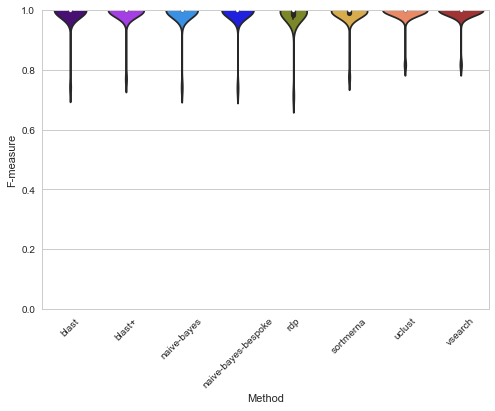

## gg_13_8_otus level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[18,18]:0.92",0.747524,0.854652,0.983594,0.972504,0.977910
2,naive-bayes,"0.001:char:8192:[8,8]:0.0",0.692003,0.855205,0.961400,0.957798,0.959554
4,rdp,0.4,0.695065,0.833314,0.960625,0.941653,0.950748
1,blast+,0.001:1:0.51:0.8,0.642848,0.762265,0.961073,0.864836,0.908411
0,blast,1000,0.642922,0.762265,0.961071,0.864836,0.908410
5,sortmerna,0.51:0.99:1:0.9:1.0,0.624157,0.734949,0.968661,0.857607,0.907877
7,vsearch,1:0.51:0.97,0.633192,0.732345,0.979106,0.847672,0.904776
6,uclust,0.51:0.9:3,0.639338,0.728730,0.981724,0.838934,0.898139


stat         P     FDR P
Method A    Method B                                         
blast+      naive-bayes         -4.442545  0.000136  0.000293
            vsearch              0.642398  0.526032  0.566580
            rdp                 -3.920839  0.000545  0.001018
            sortmerna            0.118816  0.906301  0.906430
            blast                1.000000  0.326189  0.397100
            uclust               1.283153  0.210344  0.280503
            naive-bayes-bespoke -5.166133  0.000019  0.000061
naive-bayes vsearch              5.716772  0.000004  0.000042
            rdp                  1.448078  0.159109  0.247503
            sortmerna            5.359695  0.000012  0.000061
            blast                4.442552  0.000136  0.000293
            uclust               4.790140  0.000054  0.000136
            naive-bayes-bespoke -2.128674  0.042555  0.070090
vsearch     rdp                 -5.532257  0.000007  0.000051
            sortmerna           -0.675267  0.505248  0.566580
            blast               -0.642277  0.526110  0.566580
            uclust               1.051171  0.302498  0.384997
            naive-bayes-bespoke -6.200592  0.000001  0.000035
rdp         sortmerna            5.081310  0.000024  0.000069
            blast                3.920841  0.000545  0.001018
            uclust               5.203513  0.000018  0.000061
            naive-bayes-bespoke -3.396978  0.002127  0.003722
sortmerna   blast               -0.118651  0.906430  0.906430
            uclust               1.360447  0.184939  0.272541
            naive-bayes-bespoke -5.915944  0.000003  0.000037
blast       uclust               1.283055  0.210377  0.280503
            naive-bayes-bespoke -5.166153  0.000019  0.000061
uclust      naive-bayes-bespoke -5.295295  0.000014  0.000061

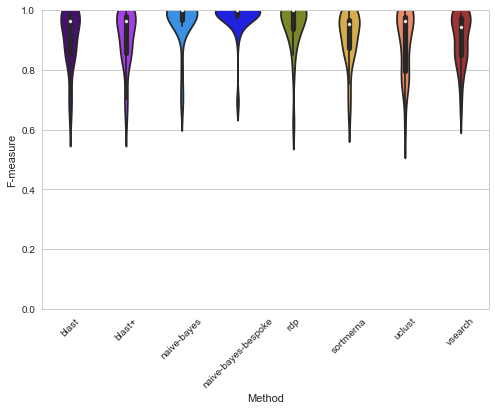

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.5",0.774533,0.829707,0.966365,0.913330,0.936868
7,vsearch,1:0.99:0.97,0.558085,0.587260,0.800121,0.722006,0.756215
1,blast+,0.001:1:0.51:0.8,0.543011,0.590632,0.781600,0.699559,0.734336
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
6,uclust,0.76:0.9:1,0.551996,0.584026,0.773162,0.622255,0.675783
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.539866,0.645513,0.775514,0.494970,0.582100
4,rdp,0.4,0.508823,0.597903,0.781453,0.487433,0.579487
5,sortmerna,0.51:0.9:1:0.9:1.0,0.514926,0.555999,0.609748,0.537393,0.567987


stat             P         FDR P
Method A    Method B                                                 
blast+      naive-bayes          2.088036  4.635904e-02  7.639518e-02
            vsearch             -1.298109  2.052297e-01  2.298573e-01
            rdp                  2.088857  4.627924e-02  7.639518e-02
            sortmerna            2.954274  6.425307e-03  1.802145e-02
            blast                1.440004  1.613617e-01  1.964403e-01
            uclust               1.502020  1.446982e-01  1.964403e-01
            naive-bayes-bespoke -6.356296  8.320207e-07  3.328083e-06
naive-bayes vsearch             -2.609719  1.460058e-02  3.442351e-02
            rdp                  0.742658  4.641017e-01  4.998018e-01
            sortmerna            0.274238  7.859889e-01  8.150996e-01
            blast               -2.087791  4.638279e-02  7.639518e-02
            uclust              -1.451109  1.582698e-01  1.964403e-01
            naive-bayes-bespoke -7.573601  3.800203e-08  4.912339e-07
vsearch     rdp                  2.605247  1.475293e-02  3.442351e-02
            sortmerna            3.612115  1.222973e-03  4.280406e-03
            blast                1.300049  2.045736e-01  2.298573e-01
            uclust               2.317250  2.831299e-02  6.098182e-02
            naive-bayes-bespoke -6.998645  1.597891e-07  1.118524e-06
rdp         sortmerna            0.216540  8.301950e-01  8.301950e-01
            blast               -2.088614  4.630287e-02  7.639518e-02
            uclust              -1.479014  1.507099e-01  1.964403e-01
            naive-bayes-bespoke -7.441775  5.263220e-08  4.912339e-07
sortmerna   blast               -2.953578  6.436231e-03  1.802145e-02
            uclust              -1.482821  1.497014e-01  1.964403e-01
            naive-bayes-bespoke -8.154994  9.279879e-09  2.598366e-07
blast       uclust               1.501824  1.447486e-01  1.964403e-01
            naive-bayes-bespoke -6.358289  8.277176e-07  3.328083e-06
uclust      naive-bayes-bespoke -6.821250  2.508812e-07  1.404934e-06

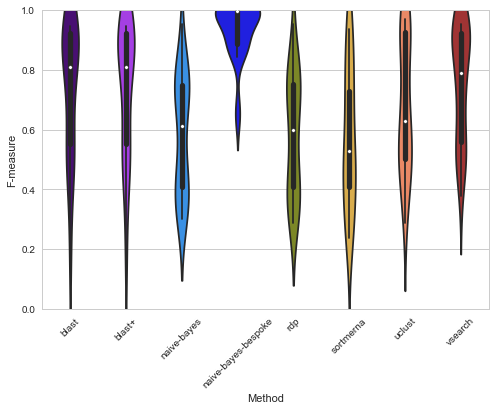

## unite_20.11.2016_clean_fullITS level 4

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",0.812025,0.645609,0.980435,0.980435,0.980435
5,sortmerna,0.51:0.99:5:0.9:1.0,0.766152,0.591239,0.977034,0.950119,0.961174
4,rdp,0.0,0.794482,0.645609,0.959546,0.959546,0.959546
7,vsearch,1:0.99:0.99,0.776349,0.578472,0.959308,0.958882,0.959094
0,blast,1000,0.804539,0.643187,0.957139,0.957139,0.957139
1,blast+,0.001:1:0.99:0.8,0.803329,0.643187,0.957139,0.957139,0.957139
2,naive-bayes,"0.001:char:8192:[7,7]:0.0",0.777382,0.645609,0.956028,0.956028,0.956028
6,uclust,1.0:0.9:1,0.716396,0.573850,0.955623,0.945129,0.949945


/Users/nbokulich/miniconda3/envs/qiime2-2017.6/lib/python3.5/site-packages/statsmodels/stats/multitest.py:320: RuntimeWarning: invalid value encountered in less_equal
  reject = pvals_sorted <= ecdffactor*alpha


stat         P  FDR P
Method A    Method B                                      
blast+      naive-bayes          0.434012  0.665890    NaN
            vsearch             -1.044782  0.300459    NaN
            rdp                 -1.285267  0.203808    NaN
            sortmerna           -1.874409  0.065913    NaN
            blast                     NaN       NaN    NaN
            uclust               2.436316  0.017929    NaN
            naive-bayes-bespoke -2.732427  0.008319    NaN
naive-bayes vsearch             -1.811657  0.075218    NaN
            rdp                 -1.887903  0.064045    NaN
            sortmerna           -1.848973  0.069560    NaN
            blast               -0.434012  0.665890    NaN
            uclust               2.440440  0.017745    NaN
            naive-bayes-bespoke -2.509888  0.014890    NaN
vsearch     rdp                 -2.458122  0.016975    NaN
            sortmerna           -1.837460  0.071266    NaN
            blast                1.044782  0.300459    NaN
            uclust               2.640136  0.010629    NaN
            naive-bayes-bespoke -2.556342  0.013219    NaN
rdp         sortmerna           -1.689226  0.096546    NaN
            blast                1.285267  0.203808    NaN
            uclust               2.663527  0.009994    NaN
            naive-bayes-bespoke -2.550530  0.013418    NaN
sortmerna   blast                1.874409  0.065913    NaN
            uclust               2.606787  0.011599    NaN
            naive-bayes-bespoke -2.561454  0.013046    NaN
blast       uclust               2.436316  0.017929    NaN
            naive-bayes-bespoke -2.732427  0.008319    NaN
uclust      naive-bayes-bespoke -2.687164  0.009387    NaN

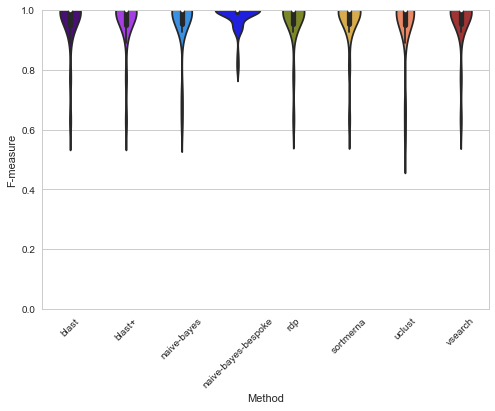

## unite_20.11.2016_clean_fullITS level 5

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.5",0.805223,0.645609,0.980435,0.980435,0.980435
5,sortmerna,0.51:0.99:5:0.9:1.0,0.779259,0.595724,0.977034,0.950119,0.961174
7,vsearch,1:0.99:0.99,0.779533,0.569530,0.959308,0.958882,0.959094
4,rdp,0.5,0.777914,0.627119,0.958893,0.957333,0.958104
1,blast+,0.001:1:0.99:0.97,0.781244,0.625000,0.958344,0.954926,0.956571
0,blast,1000,0.781527,0.625000,0.954926,0.954926,0.954926
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.766466,0.617874,0.953815,0.953815,0.953815
6,uclust,0.76:0.9:1,0.697358,0.542758,0.953015,0.942916,0.947551


stat         P     FDR P
Method A    Method B                                         
blast+      naive-bayes          1.247486  0.217233  0.225279
            vsearch             -2.187984  0.032713  0.049045
            rdp                 -1.527398  0.132098  0.142259
            sortmerna           -2.502258  0.015182  0.035424
            blast                1.790685  0.078563  0.091657
            uclust               2.652495  0.010289  0.035424
            naive-bayes-bespoke -2.659315  0.010105  0.035424
naive-bayes vsearch             -2.180630  0.033280  0.049045
            rdp                 -2.016902  0.048343  0.061527
            sortmerna           -2.112928  0.038921  0.054490
            blast               -0.434012  0.665890  0.665890
            uclust               2.467433  0.016581  0.035484
            naive-bayes-bespoke -2.516014  0.014659  0.035424
vsearch     rdp                  2.291140  0.025607  0.044812
            sortmerna           -1.837460  0.071266  0.086759
            blast                2.030208  0.046930  0.061527
            uclust               2.703904  0.008978  0.035424
            naive-bayes-bespoke -2.556342  0.013219  0.035424
rdp         sortmerna           -2.206099  0.031352  0.049045
            blast                1.656405  0.103041  0.115405
            uclust               2.686972  0.009392  0.035424
            naive-bayes-bespoke -2.552293  0.013357  0.035424
sortmerna   blast                2.407623  0.019258  0.035949
            uclust               2.658218  0.010135  0.035424
            naive-bayes-bespoke -2.561454  0.013046  0.035424
blast       uclust               2.440505  0.017742  0.035484
            naive-bayes-bespoke -2.722625  0.008540  0.035424
uclust      naive-bayes-bespoke -2.680432  0.009556  0.035424

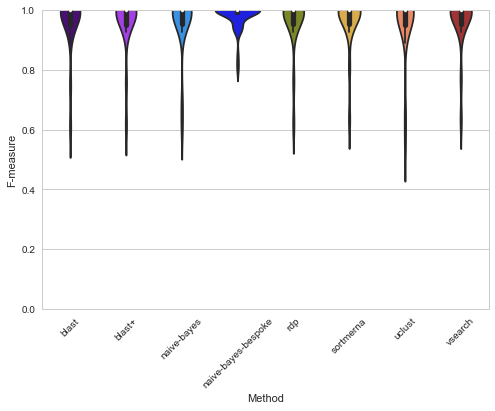

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[7,7]:0.94",0.669836,0.546032,0.972887,0.929592,0.944469
5,sortmerna,1.0:0.99:5:0.9:1.0,0.666131,0.534669,0.971207,0.925385,0.939629
4,rdp,0.6,0.658445,0.556626,0.941823,0.925922,0.932765
7,vsearch,1:0.75:0.9,0.661119,0.554507,0.934220,0.925922,0.929675
1,blast+,0.001:1:0.99:0.99,0.675403,0.542180,0.931071,0.925258,0.928022
2,naive-bayes,"0.001:char:8192:[11,11]:0.98",0.618735,0.501348,0.935384,0.878948,0.902295
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703
6,uclust,0.51:0.9:1,0.475223,0.385208,0.861520,0.856609,0.858862


stat             P         FDR P
Method A    Method B                                                 
blast+      naive-bayes          4.870672  8.955166e-06  2.089539e-05
            vsearch             -1.226348  2.250235e-01  2.250235e-01
            rdp                 -2.585395  1.226227e-02  1.907465e-02
            sortmerna           -2.266427  2.717148e-02  3.170006e-02
            blast                7.416245  5.853776e-10  2.731762e-09
            uclust               8.305885  1.884853e-11  3.122788e-10
            naive-bayes-bespoke -2.345272  2.245560e-02  2.733725e-02
naive-bayes vsearch             -4.758296  1.338066e-05  2.881987e-05
            rdp                 -5.038219  4.891520e-06  1.245114e-05
            sortmerna           -4.462116  3.790479e-05  7.580959e-05
            blast                3.342155  1.459689e-03  2.404193e-03
            uclust               4.163979  1.051109e-04  1.839441e-04
            naive-bayes-bespoke -4.261095  7.565123e-05  1.412156e-04
vsearch     rdp                 -2.554263  1.328990e-02  1.958512e-02
            sortmerna           -2.438366  1.783744e-02  2.378326e-02
            blast                7.325742  8.310027e-10  3.324011e-09
            uclust               8.156795  3.345844e-11  3.122788e-10
            naive-bayes-bespoke -2.393299  1.995446e-02  2.539659e-02
rdp         sortmerna           -2.022239  4.777186e-02  4.962695e-02
            blast                7.462607  4.892038e-10  2.731762e-09
            uclust               8.261010  2.239977e-11  3.122788e-10
            naive-bayes-bespoke -2.182273  3.315302e-02  3.713139e-02
sortmerna   blast                6.915088  4.069873e-09  1.266183e-08
            uclust               7.443678  5.263979e-10  2.731762e-09
            naive-bayes-bespoke -2.021463  4.785456e-02  4.962695e-02
blast       uclust               2.474556  1.628602e-02  2.280042e-02
            naive-bayes-bespoke -6.618927  1.275875e-08  3.572450e-08
uclust      naive-bayes-bespoke -6.996678  2.969028e-09  1.039160e-08

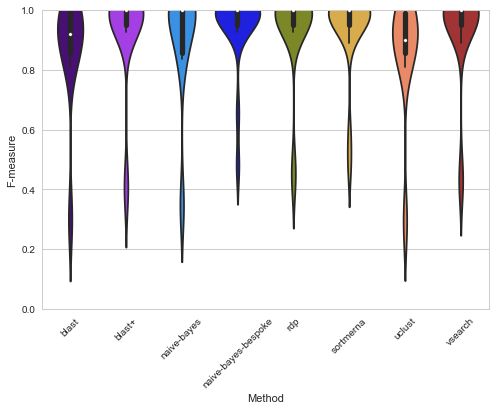

In [15]:
boxes = rank_optimized_method_performance_by_dataset(mock_results,
                                                     dataset="Reference",
                                                     metric="F-measure",
                                                     level_range=range(4,7),
                                                     display_fields=["Method",
                                                                     "Parameters",
                                                                     "Taxon Accuracy Rate",
                                                                     "Taxon Detection Rate",
                                                                     "Precision",
                                                                     "Recall",
                                                                     "F-measure"],
                                                     paired=True,
                                                     parametric=True,
                                                     color=None,
                                                     color_palette=color_palette)

In [16]:
for k, v in boxes.items():
    v.get_figure().savefig(join(outdir, 'mock-fmeasure-{0}-boxplots.pdf'.format(k)))

## Taxon Accuracy Rate

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[4,4]:0.0",0.927823,0.597525,0.516160,0.425484,0.458826
7,vsearch,1:0.99:0.99,0.562169,0.587260,0.799432,0.720764,0.755187
6,uclust,0.76:0.9:1,0.551996,0.584026,0.773162,0.622255,0.675783
1,blast+,0.001:1:0.99:0.99,0.544272,0.586863,0.781846,0.698317,0.733760
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.539866,0.645513,0.775514,0.494970,0.582100
5,sortmerna,0.51:0.99:1:0.9:1.0,0.525377,0.554015,0.611236,0.536151,0.567907
4,rdp,0.4,0.508823,0.597903,0.781453,0.487433,0.579487


stat             P         FDR P
Method A    Method B                                                  
blast+      naive-bayes           0.212505  8.333096e-01  8.641729e-01
            vsearch              -2.425184  2.226441e-02  4.156023e-02
            rdp                   2.015700  5.388359e-02  8.381892e-02
            sortmerna             3.848723  6.594780e-04  1.678671e-03
            blast                 0.614763  5.438580e-01  6.091210e-01
            uclust               -0.555331  5.832409e-01  6.281055e-01
            naive-bayes-bespoke -27.588393  2.562691e-21  3.587768e-20
naive-bayes vsearch              -1.264896  2.167174e-01  3.193730e-01
            rdp                   4.735549  6.199705e-05  1.928797e-04
            sortmerna             0.750834  4.592468e-01  5.590830e-01
            blast                -0.076405  9.396601e-01  9.396601e-01
            uclust               -0.627457  5.356306e-01  6.091210e-01
            naive-bayes-bespoke -16.486575  1.279261e-15  5.117046e-15
vsearch     rdp                   3.993466  4.502844e-04  1.260796e-03
            sortmerna             5.067429  2.540923e-05  8.893231e-05
            blast                 2.773121  9.942136e-03  2.141383e-02
            uclust                1.132319  2.674567e-01  3.744393e-01
            naive-bayes-bespoke -25.700375  1.623596e-20  1.136517e-19
rdp         sortmerna            -1.049403  3.032955e-01  4.043940e-01
            blast                -2.119006  4.343360e-02  7.153770e-02
            uclust               -3.123757  4.232996e-03  9.876990e-03
            naive-bayes-bespoke -20.249627  7.436687e-18  4.164545e-17
sortmerna   blast                -2.528026  1.762822e-02  3.525644e-02
            uclust               -2.241176  3.343682e-02  5.851443e-02
            naive-bayes-bespoke -25.840557  1.409610e-20  1.136517e-19
blast       uclust               -0.822193  4.181689e-01  5.322149e-01
            naive-bayes-bespoke -28.023011  1.703655e-21  3.587768e-20
uclust      naive-bayes-bespoke -19.500750  1.931703e-17  9.014613e-17

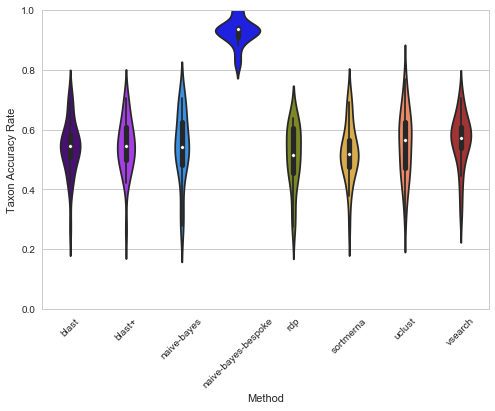

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[4,4]:0.0",0.864407,0.240370,0.592765,0.592765,0.592765
1,blast+,0.001:1:0.99:0.99,0.675403,0.542180,0.931071,0.925258,0.928022
5,sortmerna,0.51:0.99:1:0.9:1.0,0.670776,0.526194,0.925307,0.916357,0.920407
4,rdp,0.3,0.662121,0.556626,0.925922,0.925922,0.925922
7,vsearch,1:0.75:0.9,0.661119,0.554507,0.934220,0.925922,0.929675
2,naive-bayes,"0.001:char:8192:[16,16]:0.7",0.631612,0.514831,0.905683,0.899683,0.902162
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703
6,uclust,0.76:0.99:3,0.542615,0.289869,0.940503,0.433466,0.525933


stat             P         FDR P
Method A    Method B                                                  
blast+      naive-bayes           2.960666  4.441401e-03  6.908846e-03
            vsearch               1.893375  6.330007e-02  7.706096e-02
            rdp                   1.802789  7.661724e-02  8.938678e-02
            sortmerna             0.965708  3.381996e-01  3.507255e-01
            blast                10.935829  1.015963e-15  5.689390e-15
            uclust               12.309256  8.128480e-18  7.586582e-17
            naive-bayes-bespoke  -5.694165  4.327017e-07  8.077098e-07
naive-bayes vsearch              -2.430404  1.819612e-02  2.426150e-02
            rdp                  -2.395286  1.985656e-02  2.527199e-02
            sortmerna            -2.866801  5.769954e-03  8.503090e-03
            blast                 4.033016  1.628866e-04  2.682838e-04
            uclust                4.796721  1.166833e-05  2.041958e-05
            naive-bayes-bespoke  -6.545632  1.691660e-08  4.306044e-08
vsearch     rdp                  -0.686158  4.953473e-01  4.953473e-01
            sortmerna            -1.378781  1.732569e-01  1.940477e-01
            blast                14.430259  7.525972e-21  1.053636e-19
            uclust                9.883011  4.792097e-14  1.677234e-13
            naive-bayes-bespoke  -5.944326  1.683483e-07  3.855858e-07
rdp         sortmerna            -1.263380  2.115076e-01  2.277774e-01
            blast                14.848080  2.033422e-21  5.693581e-20
            uclust               10.117131  2.012525e-14  8.050099e-14
            naive-bayes-bespoke  -5.928103  1.790220e-07  3.855858e-07
sortmerna   blast                10.424247  6.506941e-15  3.036572e-14
            uclust               11.900729  3.334295e-17  2.334007e-16
            naive-bayes-bespoke  -5.750872  3.496136e-07  6.992271e-07
blast       uclust                2.744934  8.043711e-03  1.126119e-02
            naive-bayes-bespoke  -8.396074  1.332759e-11  3.731726e-11
uclust      naive-bayes-bespoke  -8.697020  4.207145e-12  1.308889e-11

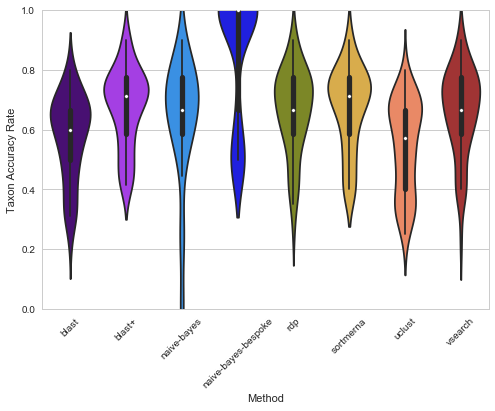

## Taxon Detection Rate

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[18,18]:0.5",0.779585,0.843331,0.802810,0.747975,0.772246
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.539866,0.645513,0.775514,0.494970,0.582100
4,rdp,0.0,0.494357,0.609701,0.765818,0.488003,0.574161
7,vsearch,1:0.75:0.9,0.560528,0.590832,0.799200,0.722006,0.755926
1,blast+,0.001:1:0.51:0.8,0.543011,0.590632,0.781600,0.699559,0.734336
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
6,uclust,0.76:0.9:1,0.551996,0.584026,0.773162,0.622255,0.675783
5,sortmerna,0.51:0.9:1:0.9:1.0,0.514926,0.555999,0.609748,0.537393,0.567987


stat             P         FDR P
Method A    Method B                                                  
blast+      naive-bayes          -3.146365  4.001401e-03  7.002452e-03
            vsearch              -0.021954  9.826459e-01  9.826459e-01
            rdp                  -1.065996  2.958653e-01  3.765559e-01
            sortmerna             5.085631  2.419690e-05  6.159212e-05
            blast                 1.000000  3.261889e-01  3.970995e-01
            uclust                0.586579  5.623593e-01  6.298424e-01
            naive-bayes-bespoke -16.172081  2.054684e-15  1.438279e-14
naive-bayes vsearch               3.474414  1.744457e-03  3.488914e-03
            rdp                   6.071805  1.751311e-06  6.129590e-06
            sortmerna             5.158391  1.990316e-05  5.572885e-05
            blast                 3.307334  2.670682e-03  4.985273e-03
            uclust                3.538778  1.478264e-03  3.183954e-03
            naive-bayes-bespoke -11.253051  1.064159e-11  4.256636e-11
vsearch     rdp                  -1.124412  2.707355e-01  3.609807e-01
            sortmerna             5.970468  2.286950e-06  7.114955e-06
            blast                 0.214412  8.318365e-01  8.626453e-01
            uclust                0.589668  5.603157e-01  6.298424e-01
            naive-bayes-bespoke -23.087499  2.598622e-19  7.276142e-18
rdp         sortmerna             3.099045  4.500807e-03  7.413094e-03
            blast                 1.189406  2.446349e-01  3.424888e-01
            uclust                1.548325  1.331869e-01  1.962754e-01
            naive-bayes-bespoke -11.845335  3.337428e-12  1.557467e-11
sortmerna   blast                -4.764394  5.737240e-05  1.338689e-04
            uclust               -2.500941  1.875395e-02  2.917281e-02
            naive-bayes-bespoke -21.467696  1.679305e-18  2.351026e-17
blast       uclust                0.411067  6.842682e-01  7.369042e-01
            naive-bayes-bespoke -16.413983  1.426167e-15  1.331089e-14
uclust      naive-bayes-bespoke -13.861357  8.559562e-14  4.793355e-13

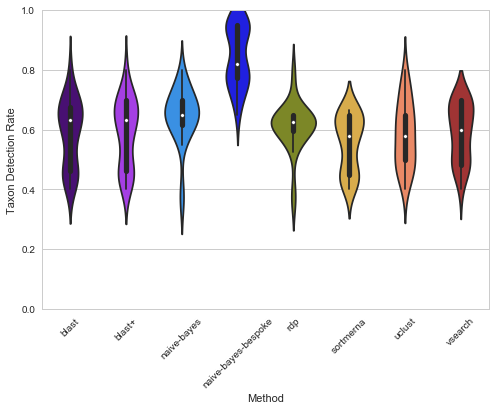

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.0",0.679121,0.569337,0.931322,0.931322,0.931322
4,rdp,0.0,0.660617,0.556626,0.925922,0.925922,0.925922
7,vsearch,1:0.75:0.9,0.661119,0.554507,0.934220,0.925922,0.929675
5,sortmerna,0.51:0.9:1:0.9:1.0,0.653569,0.543914,0.919525,0.916357,0.917861
1,blast+,0.001:1:0.99:0.99,0.675403,0.542180,0.931071,0.925258,0.928022
2,naive-bayes,"0.001:char:8192:[9,9]:0.0",0.625942,0.521186,0.880926,0.880926,0.880926
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703
6,uclust,0.76:0.9:1,0.475223,0.385208,0.861520,0.856609,0.858862


stat             P         FDR P
Method A    Method B                                                  
blast+      naive-bayes           2.112055  3.899930e-02  4.199925e-02
            vsearch              -2.656508  1.018057e-02  1.246009e-02
            rdp                  -2.882191  5.529512e-03  8.148755e-03
            sortmerna            -0.271243  7.871675e-01  7.871675e-01
            blast                 9.613323  1.310932e-13  3.058842e-13
            uclust               16.525722  1.316026e-23  7.369743e-23
            naive-bayes-bespoke  -3.985024  1.909369e-04  3.144843e-04
naive-bayes vsearch              -4.194349  9.487211e-05  1.770946e-04
            rdp                  -4.734417  1.456617e-05  3.102620e-05
            sortmerna            -3.197671  2.244873e-03  3.492025e-03
            blast                 4.716673  1.551310e-05  3.102620e-05
            uclust               16.360482  2.130221e-23  9.941031e-23
            naive-bayes-bespoke  -4.052056  1.528982e-04  2.675718e-04
vsearch     rdp                  -1.000000  3.214644e-01  3.333705e-01
            sortmerna             2.752889  7.873227e-03  1.094725e-02
            blast                15.875842  8.910020e-23  3.118507e-22
            uclust               20.353985  4.298311e-28  6.017636e-27
            naive-bayes-bespoke  -2.654483  1.023507e-02  1.246009e-02
rdp         sortmerna             2.417288  1.880108e-02  2.105720e-02
            blast                16.675607  8.525563e-24  5.967894e-23
            uclust               20.424674  3.601502e-28  6.017636e-27
            naive-bayes-bespoke  -2.417288  1.880108e-02  2.105720e-02
sortmerna   blast                10.095747  2.177971e-14  5.543925e-14
            uclust               19.893413  1.376530e-27  1.284761e-26
            naive-bayes-bespoke  -2.737302  8.210440e-03  1.094725e-02
blast       uclust               14.530769  5.482526e-21  1.705675e-20
            naive-bayes-bespoke -12.257340  9.713986e-18  2.719916e-17
uclust      naive-bayes-bespoke -15.993910  6.271512e-23  2.508605e-22

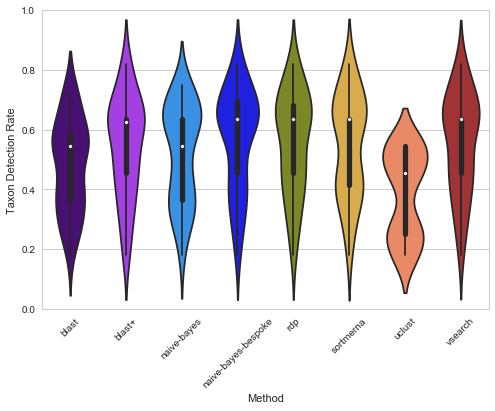

## Precision

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
7,vsearch,100:0.99:0.97,0.191464,0.186578,0.988600,0.157820,0.260185
3,naive-bayes-bespoke,"0.001:prior:char:8192:[6,6]:0.98",0.709284,0.723084,0.986527,0.536697,0.675678
1,blast+,0.001:100:0.99:0.97,0.182957,0.183682,0.976018,0.158007,0.257228
4,rdp,1.0,0.172868,0.194529,0.941480,0.160176,0.238734
5,sortmerna,1.0:0.99:5:0.9:1.0,0.378407,0.392316,0.911405,0.292386,0.428211
2,naive-bayes,"0.001:char:8192:[32,32]:0.94",0.444776,0.513583,0.906138,0.429301,0.552925
6,uclust,1.0:0.9:5,0.309652,0.326077,0.862718,0.255452,0.381379
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306


stat             P     FDR P
Method A    Method B                                             
blast+      naive-bayes          4.069772  3.678877e-04  0.001288
            vsearch             -1.000000  3.261889e-01  0.374225
            rdp                  1.282581  2.105411e-01  0.280721
            sortmerna            2.518376  1.802194e-02  0.031538
            blast                4.875675  4.253952e-05  0.000199
            uclust               2.757891  1.030878e-02  0.019243
            naive-bayes-bespoke -0.983424  3.341298e-01  0.374225
naive-bayes vsearch             -5.672167  5.039983e-06  0.000047
            rdp                 -1.241121  2.252367e-01  0.286665
            sortmerna           -0.182603  8.564735e-01  0.856474
            blast                2.772028  9.968046e-03  0.019243
            uclust               1.003192  3.246748e-01  0.374225
            naive-bayes-bespoke -5.872902  2.959248e-06  0.000041
vsearch     rdp                  2.166629  3.925591e-02  0.064657
            sortmerna            3.091001  4.591423e-03  0.009920
            blast                5.387723  1.076473e-05  0.000061
            uclust               3.381684  2.211221e-03  0.006191
            naive-bayes-bespoke  0.323798  7.485860e-01  0.776311
rdp         sortmerna            0.955995  3.475567e-01  0.374292
            blast                4.122572  3.197686e-04  0.001279
            uclust               1.797141  8.350843e-02  0.116912
            naive-bayes-bespoke -1.999219  5.574173e-02  0.086709
sortmerna   blast                6.476723  6.085954e-07  0.000017
            uclust               1.955395  6.095940e-02  0.089835
            naive-bayes-bespoke -3.089727  4.605942e-03  0.009920
blast       uclust              -3.527097  1.523446e-03  0.004740
            naive-bayes-bespoke -5.381372  1.094920e-05  0.000061
uclust      naive-bayes-bespoke -3.269367  2.939558e-03  0.007483

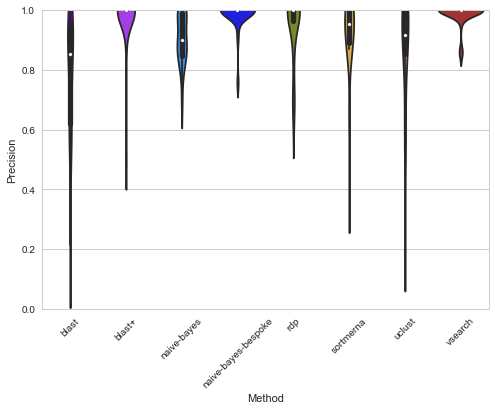

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[9,9]:0.94",0.665330,0.548151,0.973077,0.924192,0.939285
5,sortmerna,1.0:0.99:5:0.9:1.0,0.666131,0.534669,0.971207,0.925385,0.939629
1,blast+,0.001:10:0.99:0.99,0.511648,0.404468,0.966035,0.801723,0.864648
4,rdp,1.0,0.473145,0.366140,0.942963,0.742323,0.821206
6,uclust,0.76:0.99:3,0.542615,0.289869,0.940503,0.433466,0.525933
7,vsearch,100:0.51:0.97,0.446615,0.358243,0.938101,0.754332,0.829143
2,naive-bayes,"0.001:char:8192:[11,11]:0.98",0.618735,0.501348,0.935384,0.878948,0.902295
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703


stat             P         FDR P
Method A    Method B                                                 
blast+      naive-bayes          2.213613  3.080216e-02  4.934976e-02
            vsearch              2.441905  1.768009e-02  3.300283e-02
            rdp                  1.804243  7.638628e-02  1.018484e-01
            sortmerna           -1.778564  8.055237e-02  1.025212e-01
            blast                4.799663  1.154644e-05  4.618575e-05
            uclust               2.199155  3.186780e-02  4.934976e-02
            naive-bayes-bespoke -3.318700  1.566458e-03  5.482603e-03
naive-bayes vsearch             -0.804590  4.243424e-01  4.400588e-01
            rdp                 -1.409506  1.640252e-01  1.996829e-01
            sortmerna           -2.443592  1.760549e-02  3.300283e-02
            blast                6.961497  3.401614e-09  9.524518e-08
            uclust              -2.030143  4.693685e-02  6.571158e-02
            naive-bayes-bespoke -2.607397  1.158017e-02  2.702041e-02
vsearch     rdp                 -1.068476  2.897326e-01  3.245005e-01
            sortmerna           -2.783531  7.247130e-03  2.029196e-02
            blast                6.110295  8.959916e-08  7.133179e-07
            uclust              -1.171414  2.462224e-01  2.872594e-01
            naive-bayes-bespoke -2.926724  4.885017e-03  1.519783e-02
rdp         sortmerna           -2.177976  3.348734e-02  4.934976e-02
            blast                6.076501  1.019026e-07  7.133179e-07
            uclust               0.548422  5.855073e-01  5.855073e-01
            naive-bayes-bespoke -2.360708  2.162280e-02  3.783990e-02
sortmerna   blast                4.925350  7.356967e-06  3.433251e-05
            uclust               2.481147  1.601693e-02  3.300283e-02
            naive-bayes-bespoke -1.000000  3.214644e-01  3.461924e-01
blast       uclust              -6.491661  2.081736e-08  2.914430e-07
            naive-bayes-bespoke -5.030011  5.039397e-06  2.822062e-05
uclust      naive-bayes-bespoke -2.681775  9.522331e-03  2.423866e-02

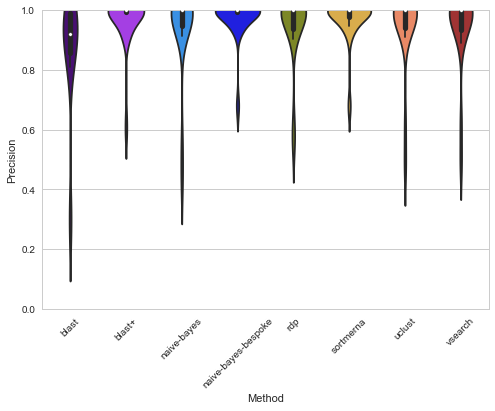

## Recall

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.0",0.779569,0.829707,0.964806,0.913330,0.936223
7,vsearch,1:0.75:0.9,0.560528,0.590832,0.799200,0.722006,0.755926
1,blast+,0.001:1:0.51:0.8,0.543011,0.590632,0.781600,0.699559,0.734336
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
6,uclust,1.0:0.9:1,0.551996,0.584026,0.773162,0.622255,0.675783
5,sortmerna,0.51:0.9:1:0.9:1.0,0.514926,0.555999,0.609748,0.537393,0.567987
2,naive-bayes,"0.001:char:8192:[32,32]:0.0",0.487359,0.602108,0.563041,0.512789,0.535682
4,rdp,0.0,0.494357,0.609701,0.765818,0.488003,0.574161


stat             P         FDR P
Method A    Method B                                                 
blast+      naive-bayes          2.219574  3.503735e-02  5.775258e-02
            vsearch             -1.077105  2.909632e-01  3.133450e-01
            rdp                  2.593803  1.514960e-02  3.032139e-02
            sortmerna            2.928088  6.848186e-03  1.748781e-02
            blast                1.440160  1.613178e-01  2.053135e-01
            uclust               1.599400  1.213698e-01  1.700039e-01
            naive-bayes-bespoke -6.993639  1.618284e-07  9.062388e-07
naive-bayes vsearch             -2.689181  1.212630e-02  2.829469e-02
            rdp                  1.391082  1.755587e-01  2.137237e-01
            sortmerna           -0.431088  6.698265e-01  6.698265e-01
            blast               -2.219221  3.506407e-02  5.775258e-02
            uclust              -1.449248  1.587845e-01  2.053135e-01
            naive-bayes-bespoke -6.550125  5.033497e-07  2.013399e-06
vsearch     rdp                  3.140113  4.064197e-03  1.264417e-02
            sortmerna            3.648799  1.111936e-03  3.891775e-03
            blast                1.079968  2.897097e-01  3.133450e-01
            uclust               2.337065  2.710111e-02  5.058874e-02
            naive-bayes-bespoke -8.091499  1.080140e-08  1.512197e-07
rdp         sortmerna           -0.858511  3.981678e-01  4.129147e-01
            blast               -2.593487  1.516069e-02  3.032139e-02
            uclust              -1.922180  6.519395e-02  1.014128e-01
            naive-bayes-bespoke -7.466465  4.950939e-08  4.620876e-07
sortmerna   blast               -2.926767  6.870211e-03  1.748781e-02
            uclust              -1.103587  2.795113e-01  3.133450e-01
            naive-bayes-bespoke -8.440399  4.720679e-09  1.321790e-07
blast       uclust               1.599123  1.214314e-01  1.700039e-01
            naive-bayes-bespoke -6.997849  1.601118e-07  9.062388e-07
uclust      naive-bayes-bespoke -6.850799  2.326614e-07  1.085753e-06

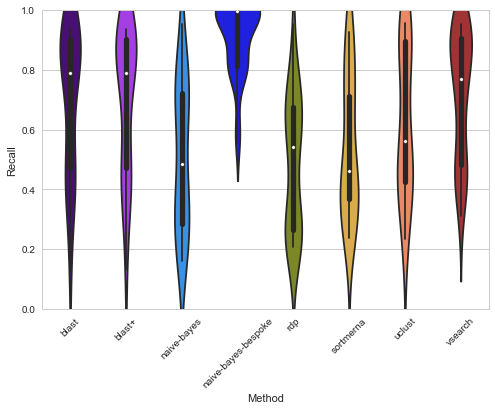

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[10,10]:0.0",0.679121,0.569337,0.931322,0.931322,0.931322
4,rdp,0.0,0.660617,0.556626,0.925922,0.925922,0.925922
7,vsearch,1:0.75:0.9,0.661119,0.554507,0.934220,0.925922,0.929675
5,sortmerna,0.51:0.99:5:0.9:1.0,0.662872,0.534669,0.947962,0.925385,0.934021
1,blast+,0.001:1:0.99:0.99,0.675403,0.542180,0.931071,0.925258,0.928022
2,naive-bayes,"0.001:char:8192:[16,16]:0.5",0.631337,0.516371,0.903318,0.899748,0.901327
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703
6,uclust,0.76:0.9:1,0.475223,0.385208,0.861520,0.856609,0.858862


/Users/nbokulich/miniconda3/envs/qiime2-2017.6/lib/python3.5/site-packages/statsmodels/stats/multitest.py:320: RuntimeWarning: invalid value encountered in less_equal
  reject = pvals_sorted <= ecdffactor*alpha


stat             P  FDR P
Method A    Method B                                          
blast+      naive-bayes          2.126819  3.770042e-02    NaN
            vsearch             -2.952960  4.538704e-03    NaN
            rdp                 -2.952960  4.538704e-03    NaN
            sortmerna           -1.426218  1.591661e-01    NaN
            blast                7.154296  1.613669e-09    NaN
            uclust               8.141534  3.548490e-11    NaN
            naive-bayes-bespoke -1.877182  6.552553e-02    NaN
naive-bayes vsearch             -2.148669  3.584739e-02    NaN
            rdp                 -2.148669  3.584739e-02    NaN
            sortmerna           -2.138312  3.671557e-02    NaN
            blast                2.518036  1.458360e-02    NaN
            uclust               3.429051  1.121125e-03    NaN
            naive-bayes-bespoke -2.080895  4.186940e-02    NaN
vsearch     rdp                       NaN           NaN    NaN
            sortmerna            2.531773  1.408018e-02    NaN
            blast                7.195561  1.375488e-09    NaN
            uclust               8.153072  3.394187e-11    NaN
            naive-bayes-bespoke -1.762370  8.327568e-02    NaN
rdp         sortmerna            2.531773  1.408018e-02    NaN
            blast                7.195561  1.375488e-09    NaN
            uclust               8.153072  3.394187e-11    NaN
            naive-bayes-bespoke -1.762370  8.327568e-02    NaN
sortmerna   blast                7.159719  1.580157e-09    NaN
            uclust               8.147637  3.466015e-11    NaN
            naive-bayes-bespoke -1.836242  7.144875e-02    NaN
blast       uclust               3.213745  2.141039e-03    NaN
            naive-bayes-bespoke -7.149526  1.643733e-09    NaN
uclust      naive-bayes-bespoke -7.620513  2.655004e-10    NaN

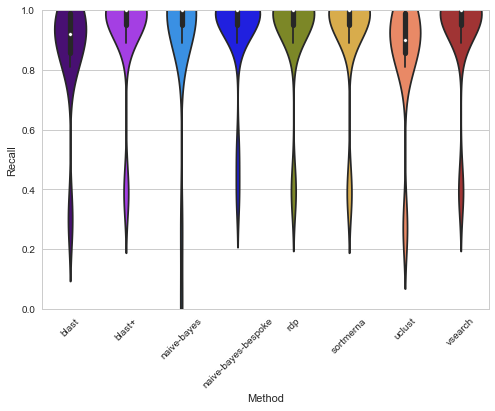

## F-measure

## gg_13_8_otus level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[32,32]:0.5",0.774533,0.829707,0.966365,0.913330,0.936868
7,vsearch,1:0.99:0.97,0.558085,0.587260,0.800121,0.722006,0.756215
1,blast+,0.001:1:0.51:0.8,0.543011,0.590632,0.781600,0.699559,0.734336
0,blast,1000,0.541281,0.588847,0.781597,0.699503,0.734306
6,uclust,0.76:0.9:1,0.551996,0.584026,0.773162,0.622255,0.675783
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.539866,0.645513,0.775514,0.494970,0.582100
4,rdp,0.4,0.508823,0.597903,0.781453,0.487433,0.579487
5,sortmerna,0.51:0.9:1:0.9:1.0,0.514926,0.555999,0.609748,0.537393,0.567987


stat             P         FDR P
Method A    Method B                                                 
blast+      naive-bayes          2.088036  4.635904e-02  7.639518e-02
            vsearch             -1.298109  2.052297e-01  2.298573e-01
            rdp                  2.088857  4.627924e-02  7.639518e-02
            sortmerna            2.954274  6.425307e-03  1.802145e-02
            blast                1.440004  1.613617e-01  1.964403e-01
            uclust               1.502020  1.446982e-01  1.964403e-01
            naive-bayes-bespoke -6.356296  8.320207e-07  3.328083e-06
naive-bayes vsearch             -2.609719  1.460058e-02  3.442351e-02
            rdp                  0.742658  4.641017e-01  4.998018e-01
            sortmerna            0.274238  7.859889e-01  8.150996e-01
            blast               -2.087791  4.638279e-02  7.639518e-02
            uclust              -1.451109  1.582698e-01  1.964403e-01
            naive-bayes-bespoke -7.573601  3.800203e-08  4.912339e-07
vsearch     rdp                  2.605247  1.475293e-02  3.442351e-02
            sortmerna            3.612115  1.222973e-03  4.280406e-03
            blast                1.300049  2.045736e-01  2.298573e-01
            uclust               2.317250  2.831299e-02  6.098182e-02
            naive-bayes-bespoke -6.998645  1.597891e-07  1.118524e-06
rdp         sortmerna            0.216540  8.301950e-01  8.301950e-01
            blast               -2.088614  4.630287e-02  7.639518e-02
            uclust              -1.479014  1.507099e-01  1.964403e-01
            naive-bayes-bespoke -7.441775  5.263220e-08  4.912339e-07
sortmerna   blast               -2.953578  6.436231e-03  1.802145e-02
            uclust              -1.482821  1.497014e-01  1.964403e-01
            naive-bayes-bespoke -8.154994  9.279879e-09  2.598366e-07
blast       uclust               1.501824  1.447486e-01  1.964403e-01
            naive-bayes-bespoke -6.358289  8.277176e-07  3.328083e-06
uclust      naive-bayes-bespoke -6.821250  2.508812e-07  1.404934e-06

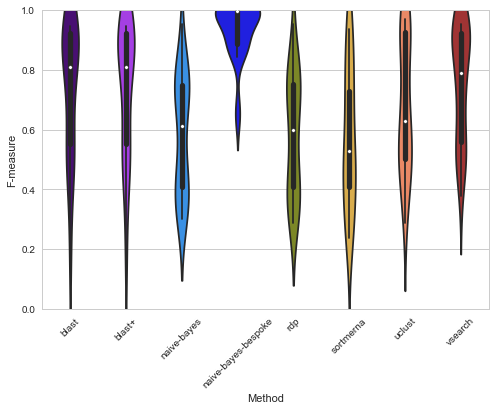

## unite_20.11.2016_clean_fullITS level 6

,Method,Parameters,Taxon Accuracy Rate,Taxon Detection Rate,Precision,Recall,F-measure
3,naive-bayes-bespoke,"0.001:prior:char:8192:[7,7]:0.94",0.669836,0.546032,0.972887,0.929592,0.944469
5,sortmerna,1.0:0.99:5:0.9:1.0,0.666131,0.534669,0.971207,0.925385,0.939629
4,rdp,0.6,0.658445,0.556626,0.941823,0.925922,0.932765
7,vsearch,1:0.75:0.9,0.661119,0.554507,0.934220,0.925922,0.929675
1,blast+,0.001:1:0.99:0.99,0.675403,0.542180,0.931071,0.925258,0.928022
2,naive-bayes,"0.001:char:8192:[11,11]:0.98",0.618735,0.501348,0.935384,0.878948,0.902295
0,blast,1000,0.575196,0.481317,0.864703,0.864703,0.864703
6,uclust,0.51:0.9:1,0.475223,0.385208,0.861520,0.856609,0.858862


stat             P         FDR P
Method A    Method B                                                 
blast+      naive-bayes          4.870672  8.955166e-06  2.089539e-05
            vsearch             -1.226348  2.250235e-01  2.250235e-01
            rdp                 -2.585395  1.226227e-02  1.907465e-02
            sortmerna           -2.266427  2.717148e-02  3.170006e-02
            blast                7.416245  5.853776e-10  2.731762e-09
            uclust               8.305885  1.884853e-11  3.122788e-10
            naive-bayes-bespoke -2.345272  2.245560e-02  2.733725e-02
naive-bayes vsearch             -4.758296  1.338066e-05  2.881987e-05
            rdp                 -5.038219  4.891520e-06  1.245114e-05
            sortmerna           -4.462116  3.790479e-05  7.580959e-05
            blast                3.342155  1.459689e-03  2.404193e-03
            uclust               4.163979  1.051109e-04  1.839441e-04
            naive-bayes-bespoke -4.261095  7.565123e-05  1.412156e-04
vsearch     rdp                 -2.554263  1.328990e-02  1.958512e-02
            sortmerna           -2.438366  1.783744e-02  2.378326e-02
            blast                7.325742  8.310027e-10  3.324011e-09
            uclust               8.156795  3.345844e-11  3.122788e-10
            naive-bayes-bespoke -2.393299  1.995446e-02  2.539659e-02
rdp         sortmerna           -2.022239  4.777186e-02  4.962695e-02
            blast                7.462607  4.892038e-10  2.731762e-09
            uclust               8.261010  2.239977e-11  3.122788e-10
            naive-bayes-bespoke -2.182273  3.315302e-02  3.713139e-02
sortmerna   blast                6.915088  4.069873e-09  1.266183e-08
            uclust               7.443678  5.263979e-10  2.731762e-09
            naive-bayes-bespoke -2.021463  4.785456e-02  4.962695e-02
blast       uclust               2.474556  1.628602e-02  2.280042e-02
            naive-bayes-bespoke -6.618927  1.275875e-08  3.572450e-08
uclust      naive-bayes-bespoke -6.996678  2.969028e-09  1.039160e-08

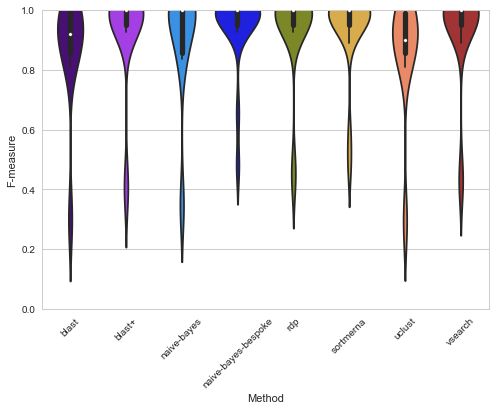

In [17]:
for metric in ["Taxon Accuracy Rate", "Taxon Detection Rate", "Precision", "Recall", "F-measure"]:
    display(Markdown('## {0}'.format(metric)))
    boxes = rank_optimized_method_performance_by_dataset(mock_results,
                                                         dataset="Reference",
                                                         metric=metric,
                                                         level_range=range(6,7),
                                                         display_fields=["Method",
                                                                         "Parameters",
                                                                         "Taxon Accuracy Rate",
                                                                         "Taxon Detection Rate",
                                                                         "Precision",
                                                                         "Recall",
                                                                         "F-measure"],
                                                         paired=True,
                                                         parametric=True,
                                                         color=None,
                                                         color_palette=color_palette)
    for k, v in boxes.items():
        v.get_figure().savefig(join(outdir, 'mock-{0}-{1}-boxplots.pdf'.format(metric, k)))

## Beta diversity method/parameter comparisons
Principal coordinate analysis offers a neat way to assess the relative performance of multiple methods to reconstruct expected compositions. Methods that cluster with the "expected" composition probably outperform those that appear more distant on a PCoA plot. First, we need to merge biom tables from each method/parameter configuration for each dataset/reference/level combination, so that we can compare each method/parameter as a separate "sample".

__*Note: if you have added additional methods and are attempting to recompute results, set force=True.*__


In [33]:
merge_expected_and_observed_tables(expected_results_dir, results_dirs, taxonomy_level=6, force=True, 
                                   dataset_ids=list(mock_results.Dataset.unique()), 
                                   reference_ids=list(mock_results.Reference.unique()), 
                                   method_ids=list(mock_results.Method.unique()))

Now we can manually select which table we want to view. This will output a Bray-Curtis PCoA plot, in addition to ANOSIM test results, which indicate whether at least two methods are significantly different from each other.

These plots are useful for visualizing the relative performance of different methods and their configurations relative to each other and to expected compositions, but are primarily a qualitative technique and do not really give us an idea of whether method X actually performs better than method Y.

__*Note that 2D plots will only appear if you are running notebooks locally. If viewing static notebooks online, make sure you are viewing this notebook in [nbviewer](http://nbviewer.jupyter.org/). (if viewing on GitHub, just copy the URL and paste into the search bar in nbviewer.)*__

In [34]:
table = join(expected_results_dir, 'mock-18', 'gg_13_8_otus', 'merged_table.biom')
sample_md, results, pc, dm = beta_diversity_pcoa(table, method="braycurtis", dim=2,
                                                 permutations=99, col='method', 
                                                 colormap=color_palette)

R =  0.286742732174 ; P =  0.01


/home/ben/miniconda3/envs/qiime2-2017.6/lib/python3.5/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:111: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -1.2081736462109671 and the largest is 13.524061791272043.
  RuntimeWarning


Loading BokehJS ...

You can also view all beta diversity plots with a single command, ``batch_beta_diversity()``, but we will only show single dataset examples in these example notebooks.

### Average dissimilarity between expected results and observed results for each method 


As we already discussed, PCoA plots are good for a qualitative overview, but don't offer much in the way of quantitative comparison. Instead, we can directly compare the Bray-Curtis dissimilarity between methods, and utilize pairwise Mann-Whitney U tests to determine precisely which methods perform better (**lower dissimilarity = more accurate classification**). In the cell below, we will use distance comparisons to determine:

    1) Whether the dissimilarity between taxonomic assignment with different parameters of the same method is greater or less than the dissimilarity between taxonomic assignments with different methods, including the expected composition.
    2) which method (averaged across all configurations) most closely reproduces the expected composition.
    
You can generate boxplots for individual datasets one-by-one with ``per_method_boxplots()``, or for all datasets individually with ``fastlane_boxplots()``. However, here we are most interested in the average performance of methods across each dataset.

The command below violin plots of distribution of distances between expected composition and predicted compositions for each method (all parameter configurations) across all samples/datasets, and pairwise Mann Whitney U tests between these distributions.

## gg_13_8_otus

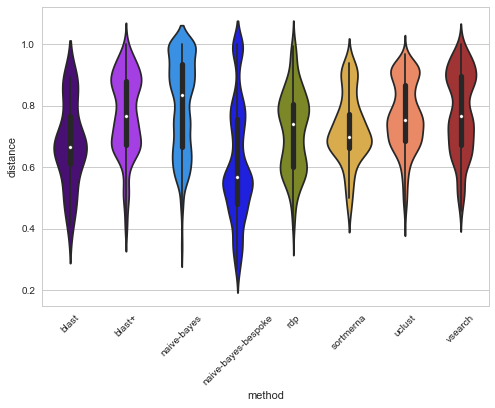

stat              P  \
Method A            Method B                                        
blast+              blast                 5.123550   3.750830e-07   
                    naive-bayes-bespoke  21.057707   3.604650e-93   
                    naive-bayes          -5.447897   5.422066e-08   
                    rdp                   5.876506   5.603218e-09   
                    sortmerna             4.623602   4.276776e-06   
                    uclust                0.460602   6.451502e-01   
                    vsearch              -1.097503   2.725715e-01   
blast               naive-bayes-bespoke   2.376851   1.752196e-02   
                    naive-bayes          -6.096060   1.222337e-09   
                    rdp                  -2.224597   2.672431e-02   
                    sortmerna            -2.829360   5.003881e-03   
                    uclust               -5.754990   1.228829e-08   
                    vsearch              -5.466148   5.730876e-08   
naive-bayes-bespoke naive-bayes         -42.058853   0.000000e+00   
                    rdp                  -9.228368   4.752963e-20   
                    sortmerna            -8.506349   2.700078e-17   
                    uclust              -20.972279   1.805146e-92   
                    vsearch             -24.920575  1.297107e-127   
naive-bayes         rdp                   9.348021   1.589160e-20   
                    sortmerna             7.413175   1.564983e-13   
                    uclust                6.050850   1.581107e-09   
                    vsearch               4.824764   1.453539e-06   
rdp                 sortmerna            -0.674307   5.004101e-01   
                    uclust               -6.197996   8.170584e-10   
                    vsearch              -6.822651   1.360274e-11   
sortmerna           uclust               -4.920069   1.014636e-06   
                    vsearch              -5.386507   8.600462e-08   
uclust              vsearch              -1.648283   9.947297e-02   

                                                 FDR P  
Method A            Method B                            
blast+              blast                 5.834625e-07  
                    naive-bayes-bespoke   3.364340e-92  
                    naive-bayes           1.002903e-07  
                    rdp                   1.206847e-08  
                    sortmerna             5.702368e-06  
                    uclust                6.451502e-01  
                    vsearch               2.935385e-01  
blast               naive-bayes-bespoke   2.133108e-02  
                    naive-bayes           3.111402e-09  
                    rdp                   3.117836e-02  
                    sortmerna             6.368576e-03  
                    uclust                2.457658e-08  
                    vsearch               1.002903e-07  
naive-bayes-bespoke naive-bayes           0.000000e+00  
                    rdp                   2.218049e-19  
                    sortmerna             1.080031e-16  
                    uclust                1.263602e-91  
                    vsearch              1.815949e-126  
naive-bayes         rdp                   8.899297e-20  
                    sortmerna             5.477441e-13  
                    uclust                3.689249e-09  
                    vsearch               2.034954e-06  
rdp                 sortmerna             5.189439e-01  
                    uclust                2.287763e-09  
                    vsearch               4.231963e-11  
sortmerna           uclust                1.495254e-06  
                    vsearch               1.416547e-07  
uclust              vsearch               1.114097e-01

## unite_20.11.2016_clean_fullITS

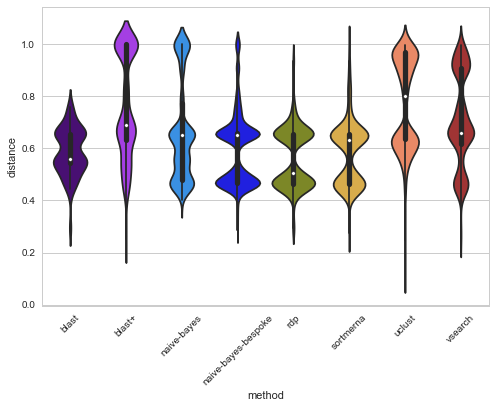

stat              P  \
Method A            Method B                                        
blast+              blast                 9.640919   1.830050e-21   
                    naive-bayes-bespoke  38.653451  8.482023e-300   
                    naive-bayes          18.640706   6.034712e-76   
                    rdp                  24.251627  9.078087e-116   
                    sortmerna            18.640578   7.000215e-72   
                    uclust               -1.433858   1.517095e-01   
                    vsearch               9.129660   1.092766e-19   
blast               naive-bayes-bespoke  -0.962448   3.358603e-01   
                    naive-bayes          -4.421985   9.939306e-06   
                    rdp                   2.141749   3.252363e-02   
                    sortmerna             0.162795   8.707347e-01   
                    uclust              -11.672483   2.316028e-30   
                    vsearch              -7.488710   9.886499e-14   
naive-bayes-bespoke naive-bayes         -21.953107  7.022254e-105   
                    rdp                   6.359202   2.155121e-10   
                    sortmerna             2.174683   2.968796e-02   
                    uclust              -42.716667   0.000000e+00   
                    vsearch             -29.307596  5.548754e-180   
naive-bayes         rdp                  13.291442   7.827892e-40   
                    sortmerna             8.948023   4.591237e-19   
                    uclust              -20.969526   4.381587e-95   
                    vsearch              -9.434689   4.964277e-21   
rdp                 sortmerna            -3.054186   2.309178e-03   
                    uclust              -28.723443  4.156486e-155   
                    vsearch             -19.882069   2.013703e-82   
sortmerna           uclust              -22.252051   1.168845e-98   
                    vsearch             -14.571551   2.558118e-46   
uclust              vsearch              11.379295   1.595565e-29   

                                                 FDR P  
Method A            Method B                            
blast+              blast                 3.202588e-21  
                    naive-bayes-bespoke  1.187483e-298  
                    naive-bayes           1.689719e-75  
                    rdp                  5.083729e-115  
                    sortmerna             1.781873e-71  
                    uclust                1.633794e-01  
                    vsearch               1.699857e-19  
blast               naive-bayes-bespoke   3.482995e-01  
                    naive-bayes           1.265003e-05  
                    rdp                   3.642646e-02  
                    sortmerna             8.707347e-01  
                    uclust                4.632056e-30  
                    vsearch               1.384110e-13  
naive-bayes-bespoke naive-bayes          3.277052e-104  
                    rdp                   2.873495e-10  
                    sortmerna             3.463596e-02  
                    uclust                0.000000e+00  
                    vsearch              5.178838e-179  
naive-bayes         rdp                   1.686008e-39  
                    sortmerna             6.766033e-19  
                    uclust                1.533556e-94  
                    vsearch               8.176456e-21  
rdp                 sortmerna             2.811173e-03  
                    uclust               2.909540e-154  
                    vsearch               6.264853e-82  
sortmerna           uclust                4.675380e-98  
                    vsearch               5.968942e-46  
uclust              vsearch               2.978388e-29

In [12]:
boxes, best = average_distance_boxplots(expected_results_dir, paired=False,
                                        use_best=False, color_palette=color_palette)

In [35]:
for k, v in boxes.items():
    v.get_figure().savefig(join(outdir, 'mock-nonopt-distance-{0}-boxplots.pdf'.format(k)))

### Average distance between expected results and observed results for each method with optimized parameters 
Reports the top-performing parameter configuration for each method, violin plots of distribution of distances between expected composition and predicted compositions for the top parameter for each method across all samples/datasets, and pairwise paired Wilcoxon signed rank tests between these distributions.

## gg_13_8_otus

,method,params,distance
6,uclust,0.76:0.9:1,0.697222
7,vsearch,1:0.99:0.99,0.675437
0,blast,1000,0.674382
4,rdp,0.3,0.671381
5,sortmerna,0.51:0.99:1:0.9:1.0,0.671113
1,blast+,0.001:1:0.99:0.8,0.666258
2,naive-bayes,"0.001:char:8192:[6,6]:0.0",0.655735
3,naive-bayes-bespoke,"0.001:prior:char:8192:[9,9]:0.0",0.467257


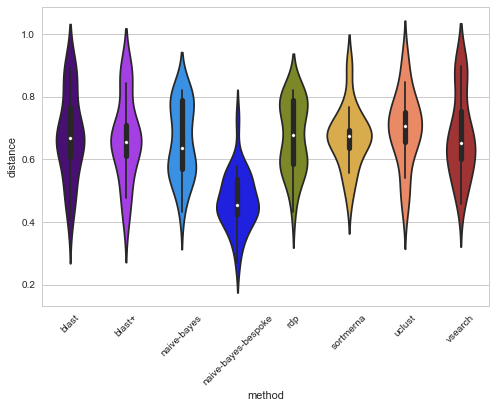

stat             P         FDR P
Method A            Method B                                                 
blast+              blast               -0.226415  8.217339e-01  9.923969e-01
                    naive-bayes-bespoke  6.532120  2.365461e-08  9.461843e-08
                    naive-bayes          0.314748  7.541657e-01  9.923969e-01
                    rdp                 -0.156043  8.765806e-01  9.923969e-01
                    sortmerna           -0.155769  8.767957e-01  9.923969e-01
                    uclust              -0.919897  3.617176e-01  9.923969e-01
                    vsearch             -0.258380  7.970958e-01  9.923969e-01
blast               naive-bayes-bespoke  6.708680  1.224007e-08  5.712032e-08
                    naive-bayes          0.551557  5.835275e-01  9.923969e-01
                    rdp                  0.090361  9.283350e-01  9.923969e-01
                    sortmerna            0.103580  9.178865e-01  9.923969e-01
                    uclust              -0.671160  5.049795e-01  9.923969e-01
                    vsearch             -0.029409  9.766465e-01  9.923969e-01
naive-bayes-bespoke naive-bayes         -6.732156  1.121256e-08  5.712032e-08
                    rdp                 -7.485316  6.713150e-10  6.265607e-09
                    sortmerna           -8.076811  7.417049e-11  1.038387e-09
                    uclust              -8.136249  5.949654e-11  1.038387e-09
                    vsearch             -6.834442  7.651112e-09  5.355778e-08
naive-bayes         rdp                 -0.512120  6.106552e-01  9.923969e-01
                    sortmerna           -0.534798  5.949852e-01  9.923969e-01
                    uclust              -1.319438  1.925898e-01  6.740644e-01
                    vsearch             -0.589343  5.580890e-01  9.923969e-01
rdp                 sortmerna            0.009573  9.923969e-01  9.923969e-01
                    uclust              -0.839043  4.051442e-01  9.923969e-01
                    vsearch             -0.123561  9.021217e-01  9.923969e-01
sortmerna           uclust              -0.899840  3.722010e-01  9.923969e-01
                    vsearch             -0.138786  8.901355e-01  9.923969e-01
uclust              vsearch              0.647288  5.201881e-01  9.923969e-01

## unite_20.11.2016_clean_fullITS

,method,params,distance
6,uclust,1.0:0.9:1,0.599239
0,blast,1000,0.586838
2,naive-bayes,"0.001:char:8192:[16,16]:0.7",0.574774
7,vsearch,1:0.99:0.99,0.549004
5,sortmerna,1.0:0.99:5:0.9:1.0,0.548545
4,rdp,0.3,0.548401
3,naive-bayes-bespoke,"0.001:prior:char:8192:[8,8]:0.0",0.546291
1,blast+,0.001:1:0.99:0.99,0.543117


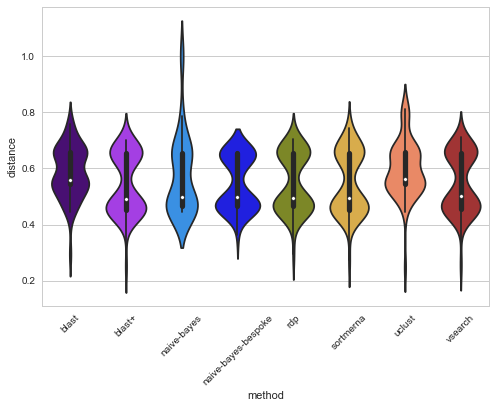

stat         P     FDR P
Method A            Method B                                         
blast+              blast               -2.437728  0.016271  0.068501
                    naive-bayes-bespoke -0.173448  0.862599  0.994093
                    naive-bayes         -1.378974  0.170533  0.434085
                    rdp                 -0.277334  0.782009  0.994093
                    sortmerna           -0.277090  0.782196  0.994093
                    uclust              -2.998939  0.003305  0.046270
                    vsearch             -0.306423  0.759823  0.994093
blast               naive-bayes-bespoke  2.418521  0.017125  0.068501
                    naive-bayes          0.554515  0.580285  0.902665
                    rdp                  2.182101  0.031084  0.104714
                    sortmerna            2.105168  0.037398  0.104714
                    uclust              -0.719140  0.473477  0.779844
                    vsearch              2.127227  0.035483  0.104714
naive-bayes-bespoke naive-bayes         -1.287859  0.200358  0.467503
                    rdp                 -0.117415  0.906732  0.994093
                    sortmerna           -0.121500  0.903504  0.994093
                    uclust              -3.006743  0.003233  0.046270
                    vsearch             -0.149526  0.881396  0.994093
naive-bayes         rdp                  1.161629  0.247750  0.485216
                    sortmerna            1.132521  0.259731  0.485216
                    uclust              -1.091567  0.277266  0.485216
                    vsearch              1.128359  0.261477  0.485216
rdp                 sortmerna           -0.007419  0.994093  0.994093
                    uclust              -2.761886  0.006667  0.047930
                    vsearch             -0.031868  0.974631  0.994093
sortmerna           uclust              -2.673968  0.008559  0.047930
                    vsearch             -0.023629  0.981189  0.994093
uclust              vsearch              2.705077  0.007840  0.047930

In [7]:
boxes, best = average_distance_boxplots(expected_results_dir, paired=False,
                                        color_palette=color_palette)

In [38]:
for k, v in boxes.items():
    v.get_figure().savefig(join(outdir, 'mock-opt-distance-{0}-boxplots.pdf'.format(k)))

In [24]:
a = best['gg_13_8_otus'].groupby(['method', 'params']).mean()
a = a.sort_values('distance')
a[a['distance'] < 0.51]


distance
method              params                                     
naive-bayes-bespoke 0.001:prior:char:8192:[9,9]:0.0    0.467257
                    0.001:prior:char:8192:[6,6]:0.0    0.467649
                    0.001:prior:char:8192:[10,10]:0.0  0.468700
                    0.001:prior:char:8192:[7,7]:0.0    0.469980
                    0.001:prior:char:8192:[9,9]:0.5    0.470198
                    0.001:prior:char:8192:[11,11]:0.0  0.470591
                    0.001:prior:char:8192:[7,7]:0.5    0.470635
                    0.001:prior:char:8192:[8,8]:0.0    0.471006
                    0.001:prior:char:8192:[6,6]:0.5    0.471651
                    0.001:prior:char:8192:[8,8]:0.5    0.472379
                    0.001:prior:char:8192:[11,11]:0.5  0.476747
                    0.001:prior:char:8192:[10,10]:0.5  0.477313
                    0.001:prior:char:8192:[16,16]:0.0  0.488763
                    0.001:prior:char:8192:[16,16]:0.5  0.490282
                    0.001:prior:char:8192:[14,14]:0.0  0.498809
                    0.001:prior:char:8192:[14,14]:0.5  0.502069
                    0.001:prior:char:8192:[12,12]:0.0  0.503721
                    0.001:prior:char:8192:[12,12]:0.5  0.505855